# cell2location results QC - version 2

Examine results of run on 2 batches of Visium data (pipeline run from Pasha Mazin)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import scipy.sparse
import anndata

In [3]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA_v2/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir
    

In [4]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

In [5]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

Activate the anndata2ri conversion between SingleCellExperiment and AnnData

In [6]:
anndata2ri.activate()

In [7]:
%load_ext rpy2.ipython

In [8]:
%%R
library(tidyverse)

### Plotting utils

In [9]:
%%R
library(tidyverse)
library(reshape2)
library(patchwork)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

In [10]:
# pip install matplotlib-scalebar
from matplotlib_scalebar.scalebar import ScaleBar

def get_pixel_size_visium(adata, library_id, spot_diameter_real = 55, img='lowres'):
    '''
    Utility function to get size of pixels from visium image in AnnData.
    Useful to plot scalebars with matplotlib_scalebar.ScaleBar
    
    Params:
    -------
    - adata: AnnData object storing image info in adata.uns[spatial]
    - library_id: string storing ID for image, must be a key in adata.uns[spatial]
    - spot_diameter_real: numeric storing real diameter of spot, in whatever unit you need 
        (default is 55, for 55 microns of Visium 10X spots)
    - img: which image to use (default: lowres)
    '''

    ## get scale factor converting original pixel positions (adata.obsm['spatial']) to 
    # pixel positions in image
    scalef = adata.uns['spatial'][library_id]['scalefactors']['tissue_{i}_scalef'.format(i=img)]
    ## get spot diameter in image pixels
    spot_diameter_img = adata.uns['spatial'][library_id]['scalefactors']['spot_diameter_fullres'] * scalef
    ## Calculate pixel size
    pixel_size_real = spot_diameter_real/spot_diameter_img
    return(pixel_size_real)


In [11]:
def _spatial_plot_lib(adata_vis, lib, color_by=None, **kwargs):
    with matplotlib.rc_context({"axes.facecolor": "black"}):
        s_ind = adata_vis.obs['sample'] == lib
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[lib in i for i in s_keys]][0]
        adata_small = adata_vis[s_ind, :].copy()
        sc.pl.spatial(adata_small, library_id=s_spatial,
                                **kwargs)
        
def _plot_sorted_violin(merged_adata_bcells, groupby, y_value, return_list=False):
    n_cells_anno = merged_adata_bcells.obs[[groupby,y_value]].value_counts(groupby)
    keep_anno = n_cells_anno.index[n_cells_anno > 30]

    mean_sim = merged_adata_bcells.obs[[groupby,y_value]].groupby(groupby).mean()
    anno_order = mean_sim.loc[keep_anno].sort_values(y_value, ascending=False).index.tolist()

    merged_adata_bcells.var_names_make_unique()
    sc.pl.violin(merged_adata_bcells[merged_adata_bcells.obs[groupby].isin(keep_anno)], 
                                     y_value, groupby=groupby, rotation=90, 
                                     order=anno_order)
    if return_list:
        return(anno_order)
    

In [401]:
def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.
    
    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """
    
    slide = adata[adata.obs[s_col].isin([s]), :].copy()
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}
    
    return slide

def plot_spatial_per_cell_type(adata, 
                                   cell_type='total_counts',
                                   samples=['WSSS_F_IMMsp9838712', 'WSSS_F_IMMsp9838717', 
                                             'WSSS_F_IMMsp9838710', 
                                             'WSSS_F_IMMsp9838715', 
                                            'WSSS_F_IMMsp9838711', 'WSSS_F_IMMsp9838716'],
                               cmap='magma',
                                  ncol=3, prefix='', figsize=(18, 8), **kwargs):
        n_samples = len(samples)
        nrow = int(np.ceil(n_samples / ncol))
        fig, axs = plt.subplots(nrow, ncol, figsize=figsize)
        if nrow == 1:
            axs = axs.reshape((1, ncol))
        if cell_type:
            col_name = f'{prefix}{cell_type}'
#             vmax = np.quantile(adata[adata.obs["sample"].isin(samples)].obs[col_name].values, 0.992)
            adata.obs[cell_type] = adata.obs[col_name].copy()

        from itertools import chain
        ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))

        for i, s in enumerate(samples):
            sp_data_s = select_slide(adata, s, s_col='sample')
            lib_id = [x for x in sp_data_s.uns['spatial'].keys()][0]
            pix_size = get_pixel_size_visium(sp_data_s, lib_id, img='hires')
            vmax = np.quantile(sp_data_s.obs[col_name].values, 0.992)
            if cell_type:
                sc.pl.spatial(sp_data_s, cmap=cmap,
                              color=cell_type, 
                              size=1, img_key='hires', alpha_img=1,
                              vmin=0, vmax=vmax, ax=axs[ind[i][0],ind[i][1]], show=False, **kwargs
                                                )
                axs[ind[i][0],ind[i][1]].title.set_text(cell_type+'\n'+s)
                scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='lower right')
                axs[ind[i][0],ind[i][1]].add_artist(scalebar)
            else: 
                sc.pl.spatial(sp_data_s,
                              color=cell_type, 
                              size=1, img_key='hires', alpha_img=1,
                              ax=axs[ind[i][0],ind[i][1]], show=False, **kwargs)
                axs[ind[i][0],ind[i][1]].title.set_text(s)
                scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='lower right')
                axs[ind[i][0],ind[i][1]].add_artist(scalebar)
        fig.tight_layout(pad=0.5)

        return fig

In [13]:
def plot_w_ggplot(r_fct_str, args, figdir, pl_name='plot', pl_width=8, pl_height=8):

    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP

    r_pkg = STAP(r_fct_str, "r_pkg")
    
    # PASS OBJECTS INTO FUNCTION
    pl = r_pkg.plot_func(args)
    
    ggsave_str = '''
    save_plot <- function(pl, figdir, pl_name, pl_width, pl_height){
        pl + 
        ggsave(paste0(figdir, pl_name, ".png"), width=pl_width, height=pl_height)  +
        ggsave(paste0(figdir, pl_name, ".pdf"), width=pl_width, height=pl_height)
    }
    
    '''
    r_save = STAP(ggsave_str, "r_save")
    r_save.save_plot(pl, figdir, pl_name=pl_name, pl_width=pl_width, pl_height=pl_height)
    

In [14]:
select_slides = {
    'SP':['WSSS_F_IMMsp9838710', 'WSSS_F_IMMsp9838715'],
    "LI":['WSSS_F_IMMsp9838712', 'WSSS_F_IMMsp9838717'],
    "TH":['WSSS_F_IMMsp9838716', 'WSSS_F_IMMsp9838711'],
    }

def _plot_slides_spatial(adata_vis_full, 
                         col_name, 
                         samples = sum(select_slides.values(), []), 
                         ncol=4, vmin=0):
    n_samples = len(samples)
    nrow = int(np.ceil(n_samples / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(18, 8))
    if nrow == 1:
        axs = axs.reshape((1, ncol))

    from itertools import chain
    ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))

    for i, s in enumerate(samples):
        vmax = np.quantile(adata_vis_full[adata_vis_full.obs["sample"].isin([s])].obs[col_name].values, 0.992)
        sns.set_context("notebook", font_scale=1.1)
        plt.rcParams["figure.figsize"] = [10,10]
        plt.rcParams['axes.titlesize'] = 32
        _spatial_plot_lib(adata_vis_full, color=[col_name], lib=s, ncols=1, size=1.3, vmin=vmin, vmax=vmax,
                          cmap="magma", frameon=False, title="",
                          ax=axs[ind[i][0],ind[i][1]], show=False
                         )
        plt.locator_params(axis='y', nbins=3)
        plt.rcParams['axes.titlesize'] = 20

    fig.tight_layout()
    return(fig)

In [15]:
%%R
library(patchwork)

plot_factor_id <- function(nmf_fractions, f, min_frac= 0.1, n_top=NULL, basesize=16,
                           highlight_cts = NULL
                          ){
    highlight_color = 'red'
    nmf_frac_df <- nmf_fractions %>%
        rownames_to_column('celltype') %>%
         pivot_longer(cols=-celltype, names_to="factor") %>%
        mutate(factor=str_remove(factor, 'mean_cell_type_factors')) 
    nmf_frac_df <- nmf_frac_df %>%
     filter(factor==paste0('fact_',f)) %>%
        filter(value > min_frac) %>%
        arrange(value) %>%
        mutate(celltype=factor(celltype, levels=celltype))
    
    if (!is.null(n_top)){
        nmf_frac_df <- nmf_frac_df %>%
        top_n(n_top, value)
    }
    
    if (!is.null(highlight_cts)){
       nmf_frac_df <- nmf_frac_df %>%
        mutate(ct_highlight=celltype %in% highlight_cts)
        label_colors <- ifelse(nmf_frac_df$celltype %in% highlight_cts, highlight_color,'black')
        label_facefont <- ifelse(nmf_frac_df$celltype %in% highlight_cts, 'bold','plain')
    }
    
    
    pl <- nmf_frac_df %>%
        ggplot(aes(value, celltype)) +
        geom_point(size=5) +
        geom_col(color='black', width=0.01) +
        theme_bw(base_size=basesize) +
        xlab("celltype fraction") +
        ggtitle(paste0("Factor", f))
    
    if (!is.null(highlight_cts)){
       pl <- pl +
        geom_point(data=. %>% filter(ct_highlight), size=6, color=highlight_color) +
        geom_col(data=. %>% filter(ct_highlight), color=highlight_color, width=0.02) +
        theme(axis.text.y = element_text(colour = label_colors, face=label_facefont))
    }
    
    return(pl)
    }

In [16]:
org_colors = pd.read_csv('../../metadata/organ_colors.csv')
org_colors

,organ,color
0,YS,#0173b2
1,LI,#de8f05
2,BM,#029e73
3,TH,#d55e00
4,SP,#cc78bc
5,MLN,#ca9161
6,SK,#fbafe4
7,GU,#949494
8,KI,#ece133


### Load scRNA-seq cell numbers
used for further filtering

In [17]:
## Filter maternal contaminants
data_dir = '/nfs/team205/ed6/data/Fetal_immune/'
timestamp = '20210429'
mat_barcodes = pd.read_csv("~/Pan_fetal_immune/metadata/souporcell_results/maternal_barcodes.csv", index_col=0)
mat_barcodes["x"] = pd.Series([x.split("-1")[0] for x in mat_barcodes['x']])
anno_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv", index_col=0)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [18]:
## Abundance in sc data
sc_ct_donor_counts = anno_obs[anno_obs.organ.isin(["TH", "LI", "SP", "GU"])].groupby(['organ','anno_lvl_2_final_clean', 'donor']).count().unstack(fill_value=0).stack()
sc_ct_donor_counts = sc_ct_donor_counts.reset_index()[['organ','anno_lvl_2_final_clean','donor', 'n_genes']]
sc_ct_donor_counts.columns = ['organ','anno_lvl_2_final_clean','donor','n_cells']

In [19]:
%%R -i sc_ct_donor_counts -o ct_donor_filter
ct_donor_filter <- sc_ct_donor_counts %>%
    group_by(organ, anno_lvl_2_final_clean) %>%
    summarise(donor_pass=sum(n_cells > 10) >= 3) %>%
    ungroup() %>%
    filter(donor_pass) %>%
    select(organ, anno_lvl_2_final_clean)

`summarise()` has grouped output by 'organ'. You can override using the `.groups` argument.


In [20]:
def ct_donor_pass_filter(ct, org):
    return(ct in ct_donor_filter[ct_donor_filter.organ == org]['anno_lvl_2_final_clean'].values)

In [21]:
ct_donor_pass_filter('CD8AA', "SP")

True

In [643]:
def get_undetected_cts(abundance_df, detection_thresh = 0.15):
    max_val_sample = abundance_df.groupby(['sample']).quantile(q=0.992).T
    return(max_val_sample.index[(max_val_sample < detection_thresh).sum(1) > 1])

In [576]:
## Plotting utils 4 colocation NMF 
def plot_nmf_fractions_ct(pl_df, org_fs, outfile, hm_height=10, hm_width=12):
    r_fct_str = '''
    library(tidyverse)
    plot_nmf_fractions <- function(pl_df, org_fs, outfile, save=TRUE, pl_height=10, pl_width=12){
        p1 <- pl_df %>%
            rownames_to_column("cell_type") %>%
            pivot_longer(cols=- cell_type, names_to="factor", values_to="ct_fraction") %>%
            mutate(factor=str_remove(factor, "mean_cell_type_factors")) %>%
            group_by(cell_type) %>%
            mutate(top_fact = which.max(ct_fraction)) %>%
            ungroup() %>%
            arrange(top_fact) %>%
            mutate(cell_type=factor(cell_type, levels=unique(cell_type))) %>%
            filter(factor %in% org_fs) %>%
            mutate(factor = factor(str_replace(factor, "fact_", "Factor "), levels=str_replace(org_fs, "fact_", "Factor "))) %>%
            ggplot(aes(factor, cell_type, color=ct_fraction, size=ct_fraction)) +
            geom_point() +
            scale_color_viridis_c(option='magma', direction=-1, name="cell type\nfraction", guide = "legend") +
            scale_size(name="cell type\nfraction") +
            ylab("cell type") +
            theme_bw(base_size=14) +
            theme(axis.text.x=element_text(angle=45, hjust=1, vjust=1)
                 )
        if (isTRUE(save)){
            print(paste0('saving to ', outfile))
            ggsave(paste0(outfile, '.pdf'), p1, height=pl_height, width=pl_width)
            ggsave(paste0(outfile, '.png'), p1, height=pl_height, width=pl_width)
          } else {
           print("not saving")
          p1   
        }
    }
    '''

    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP

    r_pkg = STAP(r_fct_str, "r_pkg")
    # PASS OBJECTS INTO FUNCTION
    r_pkg.plot_nmf_fractions(pl_df, org_fs, outfile, pl_height = hm_height, pl_width = hm_width)

def plot_nmf_spatial(adata_vis, org_fs, lib, outfile, ncols=2):
    ## Save spatial plots 
    sns.set_context("talk")
    plt.rcParams["figure.figsize"] = [10,10]
    plt.rcParams['axes.titlesize'] = 32
    plt_titles = [None] + ["Factor " + x.split("_")[1] for x in org_fs.values]
    _spatial_plot_lib(adata_vis, color=[None] + list(org_fs.values), lib=lib, ncols=ncols, size=1.3, 
                      save=outfile, frameon=False,
                      title=plt_titles, show=False
                     )
    plt.rcParams['axes.titlesize'] = 20


def get_nmf_frac_4_plotting(nmf_fractions, org, org_fs, min_prop=0.25):
    ## Filter cell types by minimum proportion assigned to fraction
    filt_nmf_fractions = nmf_fractions[nmf_fractions[[ x for x in org_fs]].max(1) > min_prop]
    pl_df = filt_nmf_fractions[[ x for x in org_fs]]

    ## Exclude low Q annotations
    pl_df = pl_df[~pl_df.index.isin(anno_groups_dict["OTHER"])]

    return(pl_df)

In [579]:
import json
with open('../../metadata/anno_groups.json', 'r') as json_file:
    anno_groups_dict = json.load(json_file)

anno_groups_dict_rev = {x:g for g,a in anno_groups_dict.items() for x in a}
anno_groups_dict_rev = {"_".join(k.split("/")):v for k,v in anno_groups_dict_rev.items()}

In [579]:
org_fs = X_cts.columns
pl_df = get_nmf_frac_4_plotting(X_cts, org, org_fs, min_prop=0)
plot_nmf_fractions_ct(pl_df, org_fs, 
                      outfile=figdir + 'top_factors_' + org, 
                      hm_height=15,
                      hm_width=8
                     )

[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA_v2/top_factors_SP"


### Parse results and run co-location

In [716]:
def read_c2l_results(c2l_results_dir, org):
    abundance_df_all = pd.DataFrame()
    adata_ls = {}
    min_counts = 500
    for f in os.listdir(c2l_results_dir):
        if org in f:
            sdata = sc.read_h5ad(c2l_results_dir + f + '/predmodel/sp.h5ad')
            adata_ls[f] = sdata
            if min_counts is not None:
                sdata[sdata.obs['total_counts'] > min_counts].copy()
            ## Save cell type abundances in separate table
            abundance_df = sdata.obsm['q95_cell_abundance_w_sf'].copy()
            abundance_df.columns = abundance_df.columns.str.strip("q95cell_abundance_w_sf_")
            abundance_df = pd.concat([ sdata.obs[['sample','Age_PCW', "Organ", 'Fetal_id']], abundance_df], 1)
            abundance_df['scRNA_reference_ID'] = f
            abundance_df_all = pd.concat([abundance_df_all, abundance_df])

    ## Keep early slides mapped with early reference
    adata_early = adata_ls[f'subset{org}.minAge14'][adata_ls[f'subset{org}.minAge14'].obs['Age_PCW'] < 14].copy()

    ## Keep late slides mapped with late reference
    adata_late = adata_ls[f'subset{org}.maxAge13'][adata_ls[f'subset{org}.maxAge13'].obs['Age_PCW'] >= 14].copy()
    return(adata_early, adata_late, abundance_df_all)

In [717]:
def run_colocation_nmf(adata_early, adata_late):
    from cell2location.models.downstream import CoLocatedGroupsSklearnNMF

    ## Merge in one object for NMF analysis
    X_location_early = adata_early.obsm['q95_cell_abundance_w_sf'].copy()
    X_location_late = adata_late.obsm['q95_cell_abundance_w_sf'].copy()
    X_location_all = pd.concat([X_location_early, X_location_late]).fillna(0) ## Set missing cts to 0

    nmf_model = CoLocatedGroupsSklearnNMF(n_fact=10, X_data=X_location_all, n_iter=20000)

    nmf_model.fit()

    nmf_model.sample2df(node_name="nUMI_factors", ct_node_name="cell_type_factors")

    X_cts = nmf_model.cell_type_fractions.copy()
    X_cts.index = X_location_all.columns.str.strip("q95cell_abundance_w_sf_")
    X_cts.columns = [x[1] for x in X_cts.columns.str.split("mean_cell_type_factors")]

    X_locations = nmf_model.location_factors_df.copy()
    X_locations.index = X_location_all.index
    X_locations.columns = [x[1] for x in X_locations.columns.str.split("mean_nUMI_factors")]

    adata_early.obsm['nmf'] = X_locations.loc[adata_early.obs_names]
    adata_late.obsm['nmf'] = X_locations.loc[adata_late.obs_names]
    return(adata_early, adata_late, X_cts)

In [718]:
outdir = '/nfs/team205/ed6/data/Fetal_immune/spatial_analysis_outs/V2/'
if not os.path.exists(outdir):
    os.mkdir(outdir)

c2l_results_dir = '/warehouse/cellgeni/tic-1349/prediction/alpha20/'
for org in ['LI', "SP", 'TH']:
    adata_early, adata_late, abundance_df_all = read_c2l_results(c2l_results_dir, org)
    adata_early, adata_late, celltype_fractions = run_colocation_nmf(adata_early, adata_late)
    abundance_df_all.to_csv(outdir + f"{org}_abundances_all.csv")
    celltype_fractions.to_csv(outdir + f"{org}_celltype_fractions.csv")
    adata_early.write_h5ad(outdir + f"{org}_early.h5ad")
    adata_late.write_h5ad(outdir + f"{org}_late.h5ad")

init_1 - iterations until convergence: 7016
init_2 - iterations until convergence: 6871
init_3 - iterations until convergence: 7068
init_1 - iterations until convergence: 8080
init_2 - iterations until convergence: 8029
init_3 - iterations until convergence: 7918
init_1 - iterations until convergence: 11020
init_2 - iterations until convergence: 10994
init_3 - iterations until convergence: 11876


### Plot consistency between replicates
Same donor, multiple slides

In [719]:
abundance_df_sp = pd.read_csv(outdir + "SP_abundances_all.csv", index_col=0)
abundance_df_li = pd.read_csv(outdir + "LI_abundances_all.csv", index_col=0)
abundance_df_th = pd.read_csv(outdir + "TH_abundances_all.csv", index_col=0)

In [720]:
meta_cols = ['sample','Age_PCW', "Organ", 'Fetal_id', 'scRNA_reference_ID']
# ct_cols = abundance_df_all.columns[~abundance_df_all.columns.isin(meta_cols)]
# get_undetected_cts(abundance_df_all[abundance_df_all.scRNA_reference_ID == 'subsetSP.maxAge13'][['sample'] + ct_cols.tolist()])

In [721]:
def make_ct_sum(abundance_df_all, meta_cols = ['sample','Age_PCW', "Organ", 'Fetal_id', 'scRNA_reference_ID']):
    ct_cols = abundance_df_all.columns[~abundance_df_all.columns.isin(meta_cols)]
    abundance_df_all[ct_cols] = abundance_df_all[ct_cols].fillna(0)
    df1 = abundance_df_all[meta_cols].drop_duplicates().reset_index()[meta_cols]
    df2 = abundance_df_all.groupby(['sample','scRNA_reference_ID']).sum().reset_index()
    df2.drop("Age_PCW", 1, inplace=True)
    ct_sum = pd.merge(df1, df2)
    ct_sum.index = ct_sum['sample'].astype('str') + "_" +  ct_sum['scRNA_reference_ID'].astype('str')
    ct_sum[ct_cols] = ct_sum[ct_cols].fillna(0)
    return(ct_sum)

ct_sum_sp = make_ct_sum(abundance_df_sp)
ct_sum_li = make_ct_sum(abundance_df_li)
ct_sum_th = make_ct_sum(abundance_df_th)

Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"


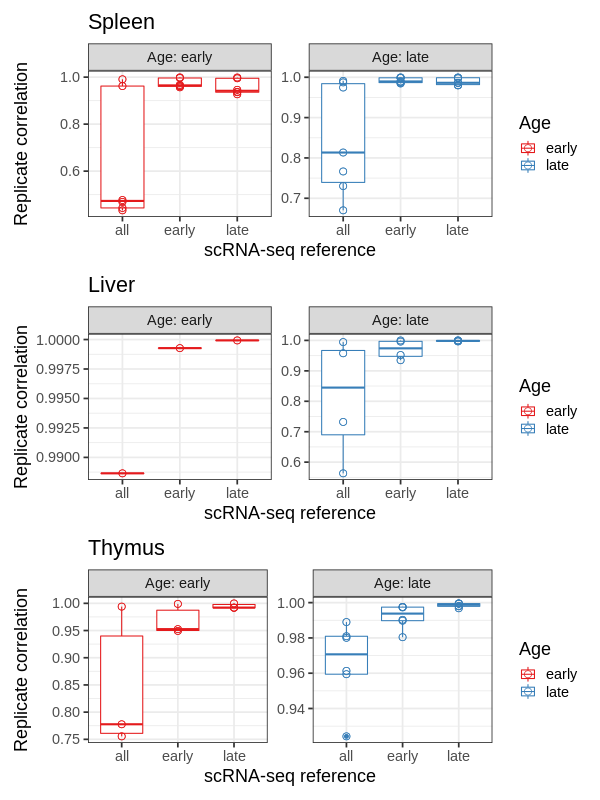

In [722]:
%%R -i ct_sum_li -i ct_sum_sp -i ct_sum_th -i meta_cols -i ct_cols -h 800 -w 600 -i figdir
plot_replicate_cor <- function(ct_sum, org){
    ct_cols = setdiff(colnames(ct_sum), meta_cols)
    df <- cor(log1p(t(filter(ct_sum, scRNA_reference_ID==glue::glue('subset{org}'))[ct_cols]))) %>%
        melt() %>%
        left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var1") %>% select(donor_v1=Age_PCW, Var1)) %>%
        left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var2") %>% select(donor_v2=Age_PCW, Var2)) %>%
        filter(value < 1) %>%
        mutate(type=ifelse(donor_v1==donor_v2, 'same_donor', 'different_donor') ) %>%
        mutate(reference='all')


    df_early <- cor(log1p(t(filter(ct_sum, scRNA_reference_ID==glue::glue('subset{org}.maxAge13'))[ct_cols]))) %>%
        melt() %>%
        left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var1") %>% select(donor_v1=Age_PCW, Var1)) %>%
        left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var2") %>% select(donor_v2=Age_PCW, Var2)) %>%
        filter(value < 1) %>%
        mutate(type=ifelse(donor_v1==donor_v2, 'same_donor', 'different_donor') ) %>%
        mutate(reference='early')

    df_late <- cor(log1p(t(filter(ct_sum, scRNA_reference_ID==glue::glue('subset{org}.minAge14'))[ct_cols]))) %>%
        melt() %>%
        left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var1") %>% select(donor_v1=Age_PCW, Var1)) %>%
        left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var2") %>% select(donor_v2=Age_PCW, Var2)) %>%
        filter(value < 1) %>%
        mutate(type=ifelse(donor_v1==donor_v2, 'same_donor', 'different_donor') ) %>%
        mutate(reference='late')

    pl <- bind_rows(df_early, df_late, df) %>%
    filter(type=="same_donor") %>%
    mutate(Age=ifelse(donor_v1 < 14, 'early', 'late')) %>%
    ggplot(aes(reference,  value, color=Age)) +
    geom_boxplot() +
    geom_point(size=3, shape=21) +
    facet_wrap(.~Age, scales='free', labeller='label_both') +
    ylab("Replicate correlation") + xlab("scRNA-seq reference") +
    theme_bw(base_size=18) +
    scale_color_brewer(palette='Set1', name='Age')
    return(pl)
    }

(plot_replicate_cor(ct_sum_sp, org='SP') + ggtitle("Spleen")) /
(plot_replicate_cor(ct_sum_li, org='LI') + ggtitle("Liver")) /
(plot_replicate_cor(ct_sum_th, org='TH') + ggtitle("Thymus")) +
ggsave(paste0(figdir, 'replicate_cor.pdf'), height=7, width=6) +
ggsave(paste0(figdir, 'replicate_cor.png'), height=7, width=6) 

### Plot cell type fraction for micro-environments 

In [723]:
celltype_frac_df_sp = pd.read_csv(outdir + "SP_celltype_fractions.csv", index_col=0)
celltype_frac_df_li = pd.read_csv(outdir + "LI_celltype_fractions.csv", index_col=0)
celltype_frac_df_th = pd.read_csv(outdir + "TH_celltype_fractions.csv", index_col=0)

In [724]:
for org,X_cts in [("SP", celltype_frac_df_sp), ("TH", celltype_frac_df_th), ("LI", celltype_frac_df_li)]:
    org_fs = X_cts.columns
    pl_df = get_nmf_frac_4_plotting(X_cts, org, org_fs, min_prop=0)
    plot_nmf_fractions_ct(pl_df, org_fs, 
                          outfile=figdir + 'top_factors_' + org, 
                          hm_height=15,
                          hm_width=8
                         )

[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA_v2/top_factors_SP"
[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA_v2/top_factors_TH"
[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA_v2/top_factors_LI"


## Measure microenvironment growth during time

In [900]:
org='LI'
adata_early = sc.read_h5ad(outdir + f"{org}_early.h5ad")
adata_late = sc.read_h5ad(outdir + f"{org}_late.h5ad")

if not any(adata_early.obsm['nmf'].columns.isin(adata_early.obs.columns)):
    adata_early.obs = pd.concat([adata_early.obs, adata_early.obsm['nmf']], 1)
if not any(adata_late.obsm['nmf'].columns.isin(adata_late.obs.columns)):
    adata_late.obs = pd.concat([adata_late.obs, adata_late.obsm['nmf']], 1)

factors_df_early = adata_early.obs[['Age_PCW', 'sample'] + adata_early.obsm['nmf'].columns.tolist()]
factors_df_late = adata_late.obs[['Age_PCW', 'sample'] + adata_late.obsm['nmf'].columns.tolist()]

factors_df = pd.concat([factors_df_early,factors_df_late], 0)

## Turn to proportions
sum_spots = factors_df[adata_late.obsm['nmf'].columns.tolist()].sum(1)
norm_fact_df = (factors_df[adata_late.obsm['nmf'].columns.tolist()].T/sum_spots).T
factors_df.loc[:,adata_late.obsm['nmf'].columns.tolist()] = norm_fact_df

In [934]:
locations_df_early = pd.concat([adata_early.obs[['Age_PCW', 'sample']], adata_early.obsm['q95_cell_abundance_w_sf']], 1)
locations_df_late = pd.concat([adata_late.obs[['Age_PCW', 'sample']], adata_late.obsm['q95_cell_abundance_w_sf']], 1)
locations_df = pd.concat([locations_df_late,locations_df_early], 0)

## Turn to proportions
sum_spots = locations_df[adata_late.obsm['q95_cell_abundance_w_sf'].columns.tolist()].sum(1)
norm_locations_df = (locations_df[adata_late.obsm['q95_cell_abundance_w_sf'].columns.tolist()].T/sum_spots).T
locations_df.loc[:,adata_late.obsm['q95_cell_abundance_w_sf'].columns.tolist()] = norm_locations_df

In [935]:
%%R -i locations_df
head(locations_df)

                                                                                Age_PCW
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACAAGTATCTCCCA-1      18
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACAATCTACTAGCA-1      18
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACAGAGCGACTCCT-1      18
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACATTTCCCGGATT-1      18
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACCCGAACGAAATC-1      18
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACCGGAAATGTTAA-1      18
                                                                                             sample
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACAAGTATCTCCCA-1 WSSS_F_IMMsp9838712
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACAATCTACTAGCA-1 WSSS_F_IMMsp9838712
spaceranger130_count_36654_WSSS_F_IMMsp9838712_GRCh38-2020-A_AAACAGAGCGACTCCT-1 WSSS

`summarise()` has grouped output by 'sample', 'Age_PCW'. You can override using the `.groups` argument.


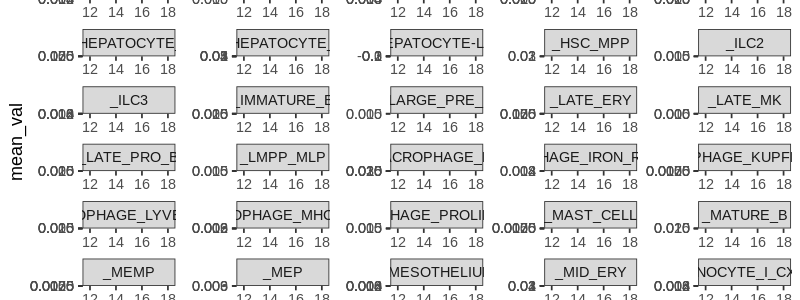

In [936]:
%%R -w 800 -h 300
locations_df %>%
    pivot_longer(cols = -c(Age_PCW, sample), names_to='ct') %>%
    mutate(ct = str_remove(ct, 'q95cell_abundance_w_sf')) %>%
    group_by(sample,Age_PCW, ct) %>%
    summarise(mean_val=mean(value), sd_val=sd(value), n=n()) %>%
    mutate(se_val = sd_val/sqrt(n)) %>%
    ggplot(aes(Age_PCW, mean_val)) +
    geom_point(position=position_dodge(width=0.5), aes(group=sample)) +
    geom_errorbar(aes(ymin=mean_val-sd_val, ymax=mean_val+sd_val, group=sample), width = 0, position=position_dodge(width=0.5)) +
    facet_wrap(ct~., scale='free', ncol=5) +
    geom_smooth(method='lm') +
    ggpubr::stat_cor() +
    theme_bw(base_size=18)

In [937]:
%%R -i factors_df -w 800 -h 500
pl_df <- locations_df %>%
    pivot_longer(cols = -c(Age_PCW, sample), names_to='ct') %>%
    mutate(ct = str_remove(ct, 'q95cell_abundance_w_sf')) %>%
    mutate(value=replace_na(value,0)) %>%
    group_by(sample,Age_PCW, ct) %>%
    summarise(mean_val=mean(value), sd_val=sd(value), n=n()) %>%
    ungroup() %>%
    mutate(se_val = sd_val/sqrt(n)) %>%
    rename(smp=sample) %>%
    arrange(Age_PCW) %>%
    mutate(smp = factor(smp, levels=unique(smp))) 
    
fact_coef_order <- pl_df %>%
    group_by(ct) %>%
    summarise(cor=cor(Age_PCW, mean_val, use='complete.obs')) %>%
    arrange(cor) %>%
    pull(ct)
    
p_top <- pl_df %>%
    ggplot(aes(smp, 1, fill=Age_PCW)) +
    geom_tile() +
    scale_fill_distiller(palette='Reds', direction=1) +
    theme_classic(base_size=18) +
    remove_x_axis() + remove_y_axis() +
    theme(axis.line=element_blank())
    
    
p_bottom <- pl_df %>%
    mutate(ct=factor(ct, levels=fact_coef_order)) %>%
    ggplot(aes(smp, ct)) +
    geom_tile(aes(fill=mean_val)) +
    scale_fill_viridis_c(name='Mean factor contribution') +
    theme_classic(base_size=18) +
    theme(axis.text.x=element_text(angle=90))
    
# (p_top / p_bottom) +
# plot_layout(ncol = 1, heights=c(1,7), guides='collect')


`summarise()` has grouped output by 'sample', 'Age_PCW'. You can override using the `.groups` argument.


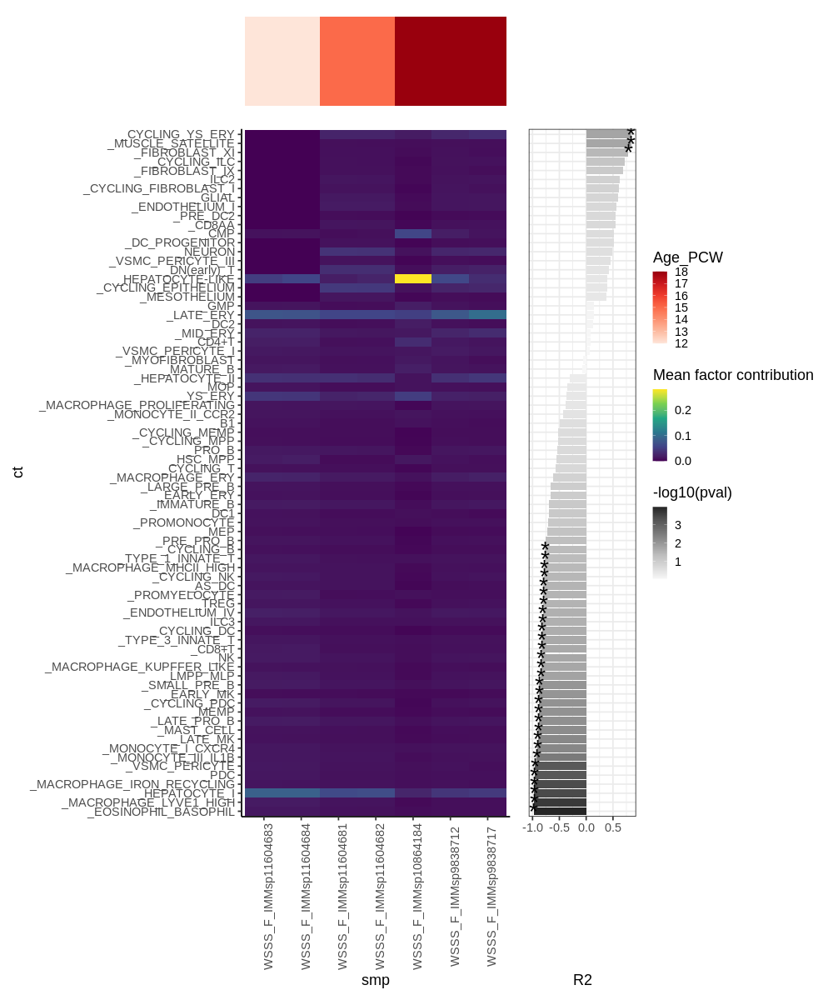

In [938]:
%%R -h 1200 -w 1000

p_right <- lapply(split(pl_df, pl_df$ct), function(x) data.frame(
    R2=Hmisc::rcorr(x$Age_PCW, x$mean_val)$r[1,2],
    pval=Hmisc::rcorr(x$Age_PCW, x$mean_val)$P[1,2],
    ct=x$ct[1]
    )) %>%
    bind_rows() %>%
    arrange(R2) %>%
    mutate(ct=factor(ct, levels=unique(ct))) %>%
    ggplot(aes(ct, R2, fill=-log10(pval))) +
    geom_col() +
    geom_text(data= . %>% filter(pval < 0.05),
              label='*', size=10) +
    coord_flip() +
    scale_fill_distiller(palette='Greys', direction=1) +
    theme_bw(base_size=18) +
    remove_y_axis()

(p_top + plot_spacer() + p_bottom + p_right) +
plot_layout(heights=c(1,7), widths=c(5,2), guides='collect')

`summarise()` has grouped output by 'sample', 'Age_PCW'. You can override using the `.groups` argument.


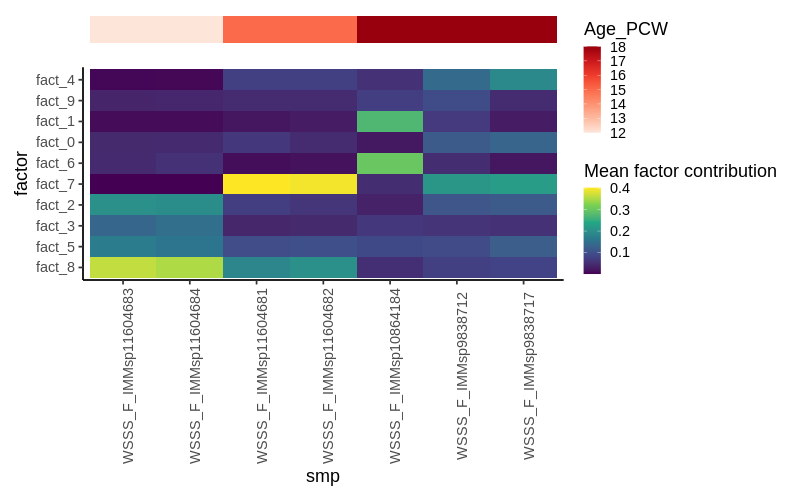

In [939]:
%%R -i factors_df -w 800 -h 500
pl_df <- factors_df %>%
    pivot_longer(cols = -c(Age_PCW, sample), names_to='factor') %>%
    group_by(sample,Age_PCW, factor) %>%
    summarise(mean_val=mean(value), sd_val=sd(value), n=n()) %>%
    ungroup() %>%
    mutate(se_val = sd_val/sqrt(n)) %>%
    rename(smp=sample) %>%
    arrange(Age_PCW) %>%
    mutate(smp = factor(smp, levels=unique(smp))) 
    
fact_coef_order <- pl_df %>%
    group_by(factor) %>%
    summarise(cor=cor(Age_PCW, mean_val)) %>%
    arrange(cor) %>%
    pull(factor)
    
p_top <- pl_df %>%
    ggplot(aes(smp, 1, fill=Age_PCW)) +
    geom_tile() +
    scale_fill_distiller(palette='Reds', direction=1) +
    theme_classic(base_size=18) +
    remove_x_axis() + remove_y_axis() +
    theme(axis.line=element_blank())
    
    
p_bottom <- pl_df %>%
    mutate(factor=factor(factor, levels=fact_coef_order)) %>%
    ggplot(aes(smp, factor)) +
    geom_tile(aes(fill=mean_val)) +
    scale_fill_viridis_c(name='Mean factor contribution') +
    theme_classic(base_size=18) +
    theme(axis.text.x=element_text(angle=90))
    
(p_top / p_bottom) +
plot_layout(ncol = 1, heights=c(1,7), guides='collect')


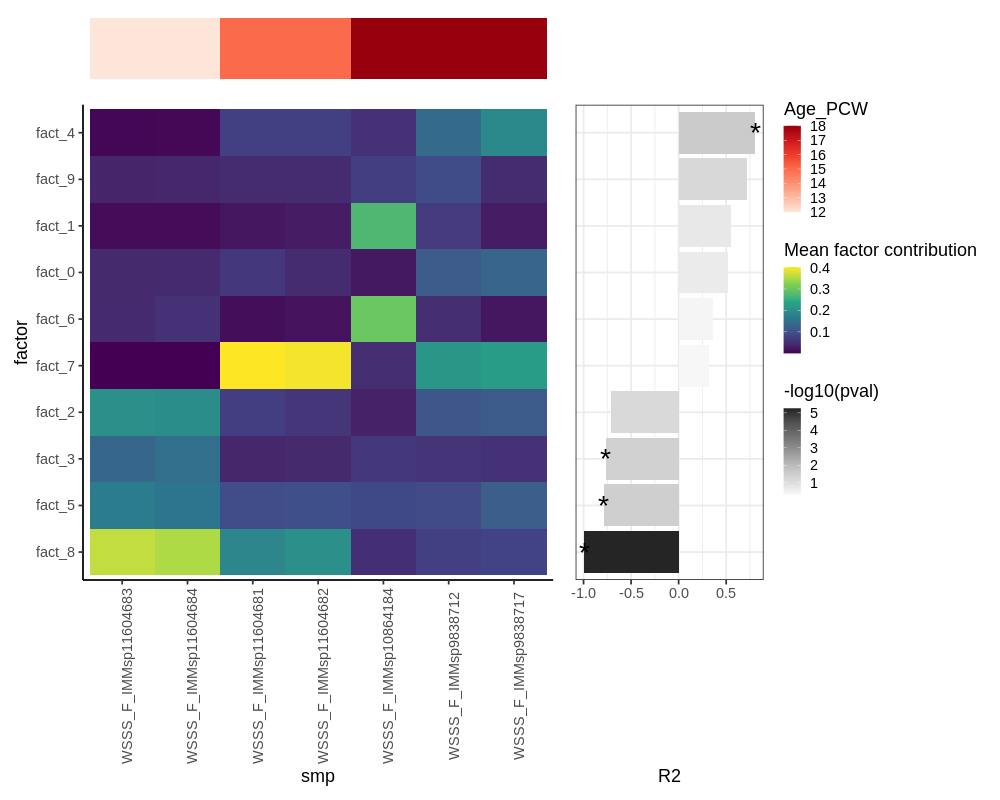

In [940]:
%%R -h 800 -w 1000

p_right <- lapply(split(pl_df, pl_df$factor), function(x) data.frame(
    R2=Hmisc::rcorr(x$Age_PCW, x$mean_val)$r[1,2],
    pval=Hmisc::rcorr(x$Age_PCW, x$mean_val)$P[1,2],
    fact=x$factor[1]
    )) %>%
    bind_rows() %>%
    arrange(R2) %>%
    mutate(fact=factor(fact, levels=unique(fact))) %>%
    ggplot(aes(fact, R2, fill=-log10(pval))) +
    geom_col() +
    geom_text(data= . %>% filter(pval < 0.05),
              label='*', size=10) +
    coord_flip() +
    scale_fill_distiller(palette='Greys', direction=1) +
    theme_bw(base_size=18) +
    remove_y_axis()
    
(p_top + plot_spacer() + p_bottom + p_right) +
plot_layout(heights=c(1,7), widths=c(5,2), guides='collect')

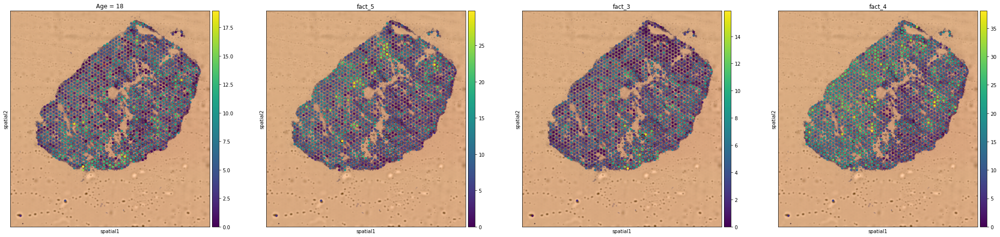

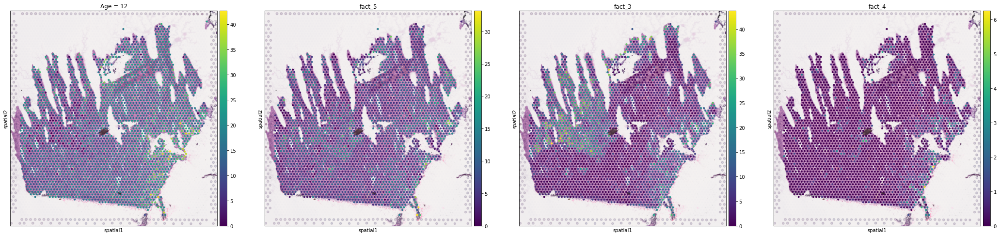

In [904]:
smps = adata_late.obs['sample'].unique()
sdata = select_slide(adata_late, smps[1])
sc.pl.spatial(sdata, color = ['fact_8', 'fact_5','fact_3','fact_4'], title = f"Age = {sdata.obs['Age_PCW'][0]}")

smps = adata_early.obs['sample'].unique()
sdata = select_slide(adata_early, smps[1])
sc.pl.spatial(sdata, color = ['fact_8', 'fact_5','fact_3','fact_4'], title = f"Age = {sdata.obs['Age_PCW'][0]}")

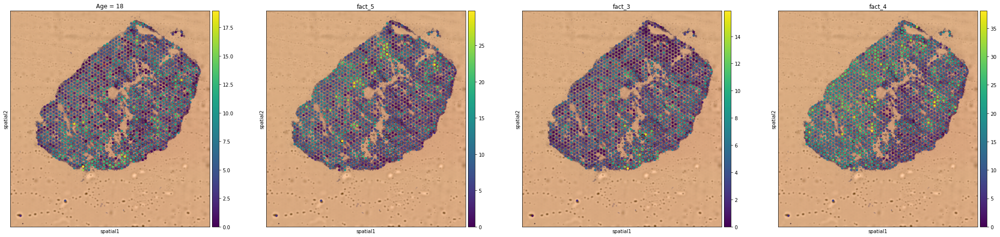

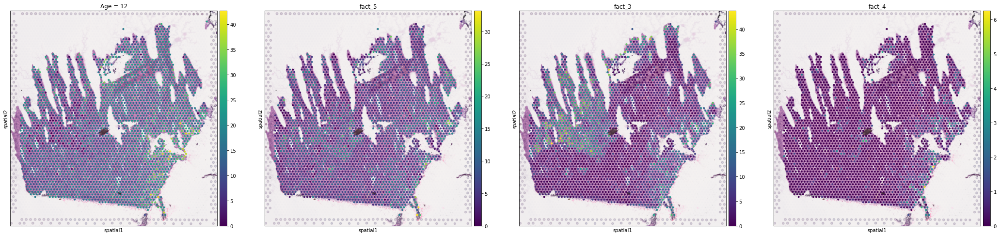

In [904]:
smps = adata_late.obs['sample'].unique()
sdata = select_slide(adata_late, smps[1])
sc.pl.spatial(sdata, color = ['fact_8', 'fact_5','fact_3','fact_4'], title = f"Age = {sdata.obs['Age_PCW'][0]}")

smps = adata_early.obs['sample'].unique()
sdata = select_slide(adata_early, smps[1])
sc.pl.spatial(sdata, color = ['fact_8', 'fact_5','fact_3','fact_4'], title = f"Age = {sdata.obs['Age_PCW'][0]}")

---

## old

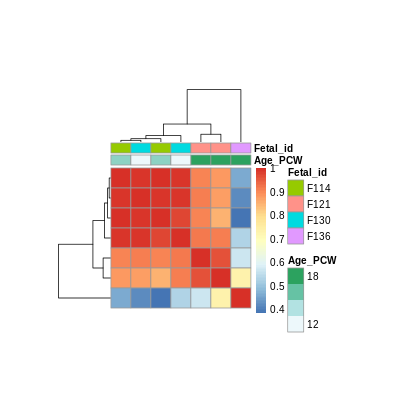

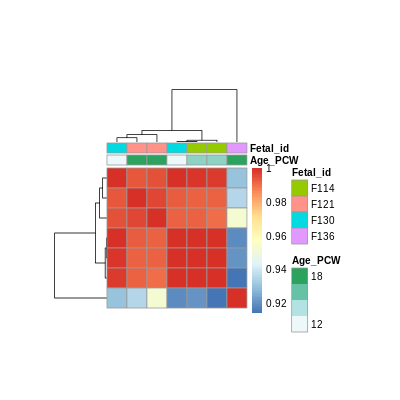

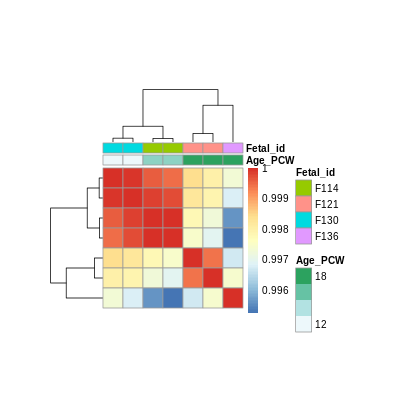

In [166]:
%%R -i ct_sum -i meta_cols -i ct_cols -h 400 -w 400
# Modify ordering of the clusters using clustering callback option
callback = function(hc, mat){
    sv = svd(t(mat))$v[,1]
    dend = reorder(as.dendrogram(hc), wts = sv)
    as.hclust(dend)
    }

pheatmap::pheatmap(cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetLI')[ct_cols]))),  
                   show_rownames=FALSE, show_colnames=FALSE, 
                   cellwidth=20,cellheight=20,
                   annotation_col=ct_sum[,c("Age_PCW", "Fetal_id")], clustering_callback=callback)
pheatmap::pheatmap(cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetLI.maxAge13')[ct_cols]))),  
                   cellwidth=20,cellheight=20,
                   show_rownames=FALSE, show_colnames=FALSE,
                   annotation_col=ct_sum[,c("Age_PCW", "Fetal_id")], clustering_callback=callback)
pheatmap::pheatmap(cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetLI.minAge14')[ct_cols]))),
                   cellwidth=20,cellheight=20,
                   show_rownames=FALSE, show_colnames=FALSE,
                   annotation_col=ct_sum[,c("Age_PCW", "Fetal_id")], clustering_callback=callback)

In [282]:
# %%R -w 1200 -h 400
# repl_df <- ct_sum %>%
#     pivot_longer(ct_cols, names_to='celltype', values_to='total_abundance') 
    
# donor_id <- 'F121'
# pl_ls <- lapply(c("F121", 'F114', 'F130'), function(donor_id){
#     sample_pair <- filter(ct_sum, Fetal_id == donor_id) %>% pull(sample) %>% as.character()
#     repl_df %>%
#         filter(Fetal_id==donor_id) %>%
#         pivot_wider(names_from=sample, values_from=total_abundance) %>%
#         rename(sample1=sample_pair[1], sample2=sample_pair[2]) %>%
#         ggplot(aes(log10(sample1), log10(sample2))) +
#         geom_point() +
#         ggpubr::stat_cor(size=7) +
#         xlab(paste0("log10(abundance) - ", sample_pair[1])) +
#         ylab(paste0("log10(abundance) - ", sample_pair[2])) +
#         theme_bw(base_size=16) +
#         coord_fixed() 
#     })

# wrap_plots(pl_ls)

In [27]:
abundance_early_ref = abundance_df_all[abundance_df_all['scRNA_reference_ID'] == 'subsetLI.maxAge13']
abundance_late_ref = abundance_df_all[abundance_df_all['scRNA_reference_ID'] == 'subsetLI.minAge14']

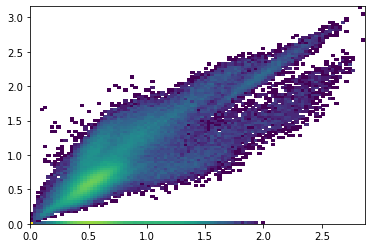

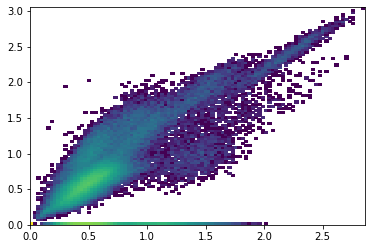

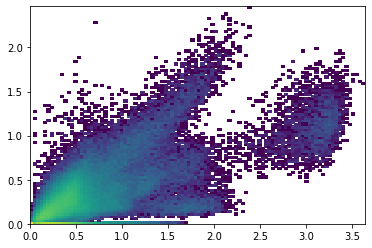

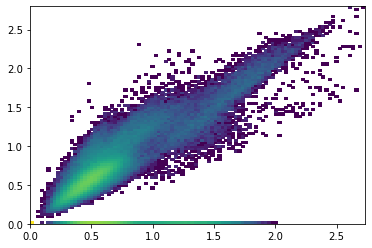

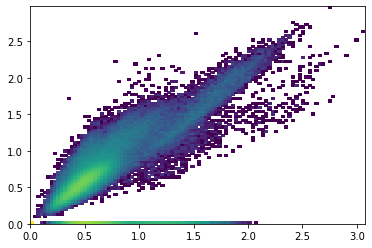

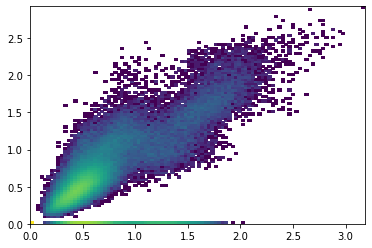

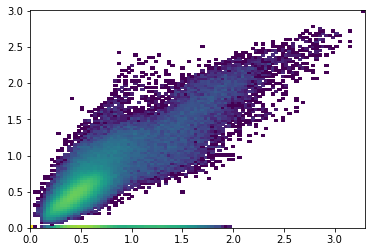

In [28]:
for s in abundance_early_ref['sample'].unique():
    plt.hist2d(np.log1p(abundance_early_ref[abundance_early_ref['sample'] == s][ct_cols].values.flatten()), 
               np.log1p(abundance_late_ref[abundance_late_ref['sample'] == s][ct_cols].values.flatten()), 
               bins=100, norm=matplotlib.colors.LogNorm());
    plt.show()

In [46]:
%%R -i abundance_df_all
nrow(abundance_df_all)

[1] 57264


In [81]:
%%R
early_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.maxAge13' & Age_PCW == 12)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_early=abundance)
late_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.minAge14'& Age_PCW == 12)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_late=abundance)

abundance <- early_abundance %>%
    mutate(abundance_late = late_abundance$abundance_late)

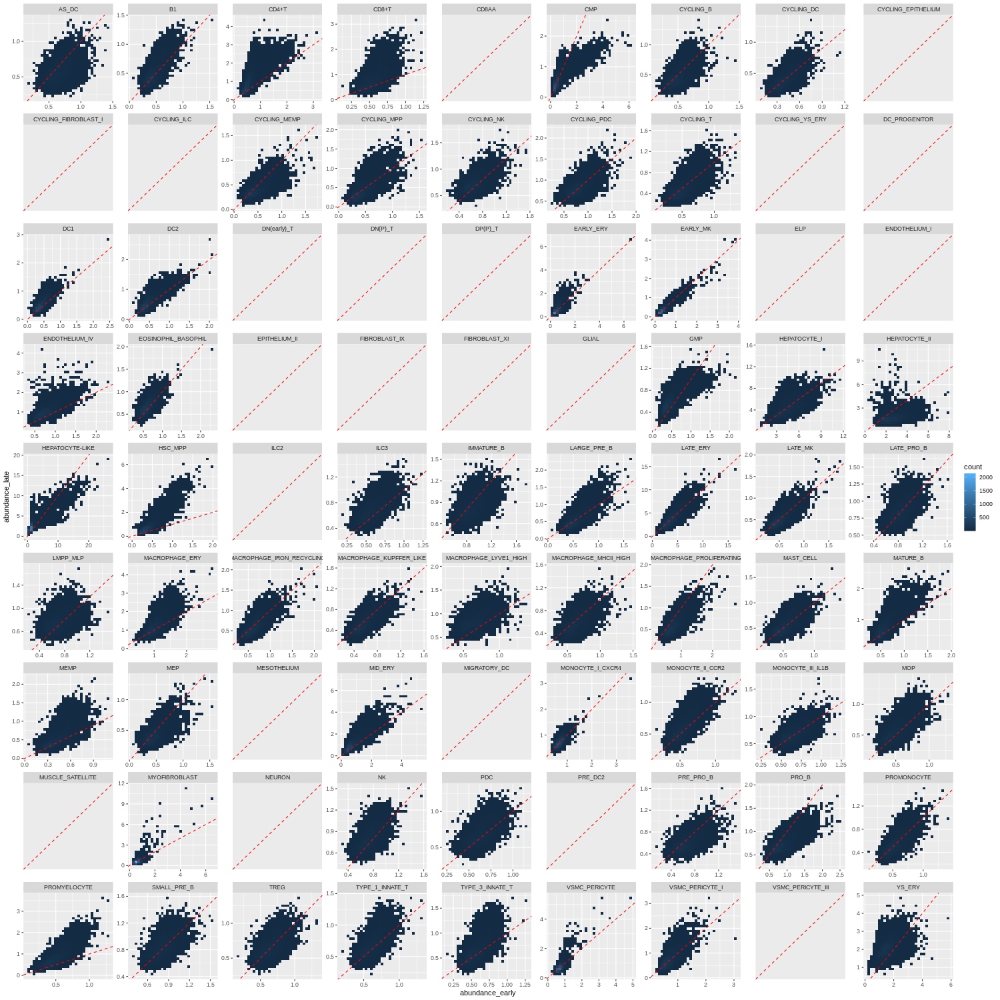

In [82]:
%%R -w 1500 -h 1500
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d() +
facet_wrap(celltype~., scales="free") +
geom_abline(linetype=2, color='red')

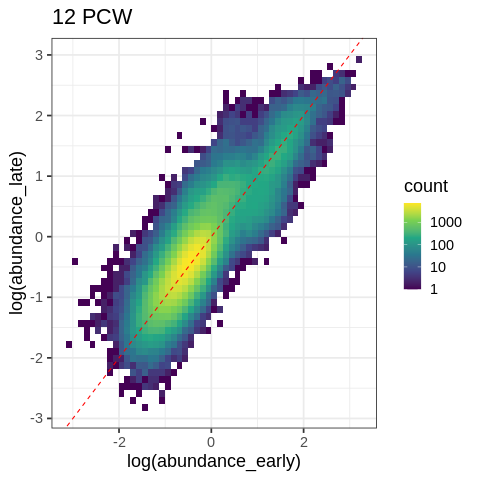

In [83]:
%%R
abundance %>%
ggplot(aes(log(abundance_early), log(abundance_late))) +
geom_bin2d(bins=50) +
geom_abline(linetype=2, color='red') +
scale_fill_viridis_c(trans = "log10") +
theme_bw(base_size=18) +
ggtitle("12 PCW")

In [84]:
%%R
early_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.maxAge13' & Age_PCW == 15)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_early=abundance)
late_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.minAge14' & Age_PCW == 15)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_late=abundance)

abundance <- early_abundance %>%
    mutate(abundance_late = late_abundance$abundance_late)

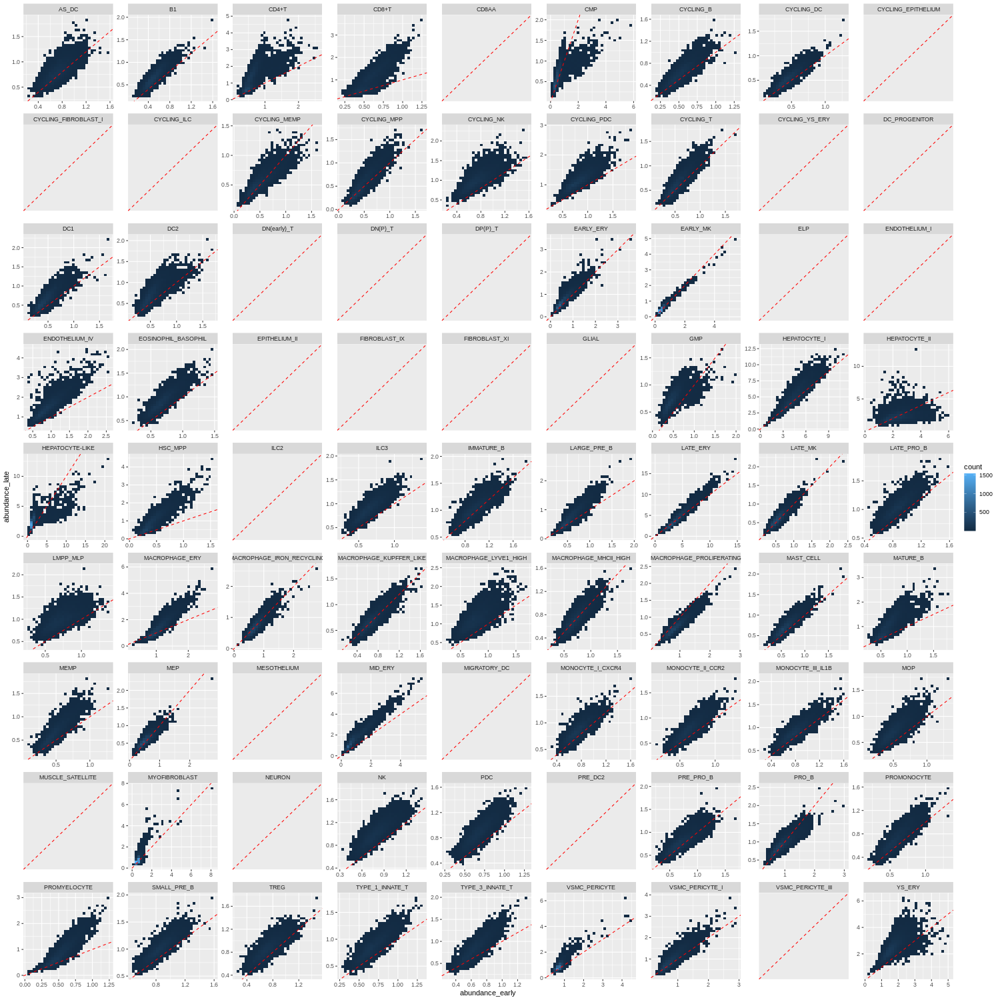

In [59]:
%%R -w 1500 -h 1500
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d() +
facet_wrap(celltype~., scales="free") +
geom_abline(linetype=2, color='red')

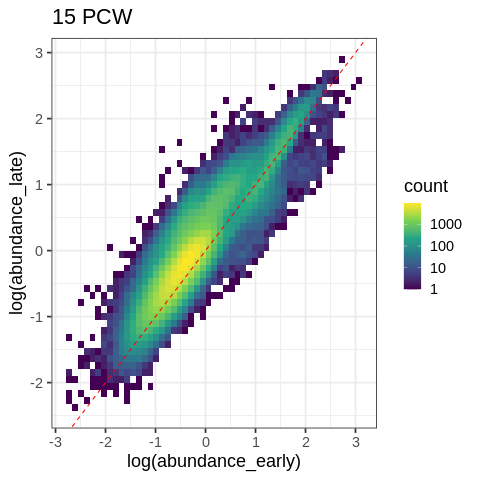

In [85]:
%%R
abundance %>%
ggplot(aes(log(abundance_early), log(abundance_late))) +
geom_bin2d(bins=50) +
geom_abline(linetype=2, color='red') +
scale_fill_viridis_c(trans = "log10") +
theme_bw(base_size=18) +
ggtitle("15 PCW")

In [86]:
%%R
early_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.maxAge13' & Fetal_id == 'F121')[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_early=abundance)
late_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.minAge14' & Fetal_id == 'F121')[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_late=abundance)

abundance <- early_abundance %>%
    mutate(abundance_late = late_abundance$abundance_late)

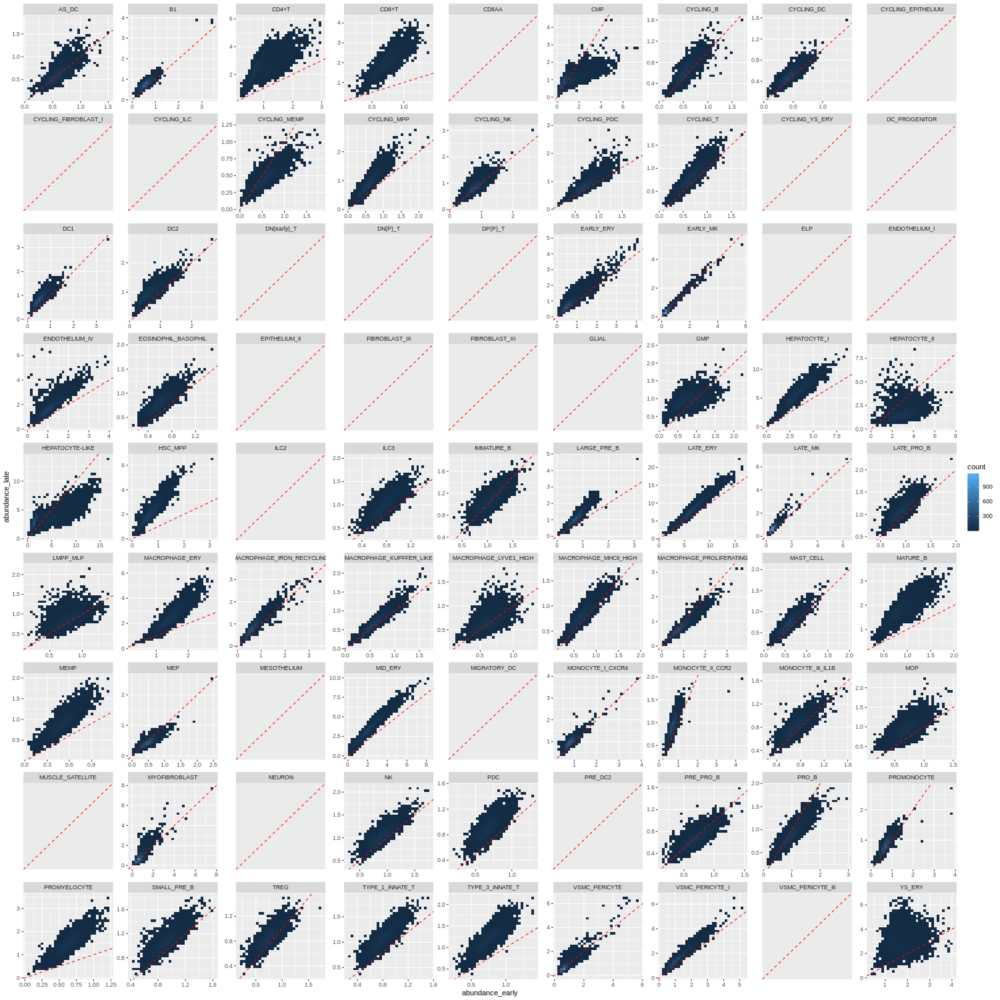

In [76]:
%%R -w 1500 -h 1500
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d() +
facet_wrap(celltype~., scales="free") +
geom_abline(linetype=2, color='red')

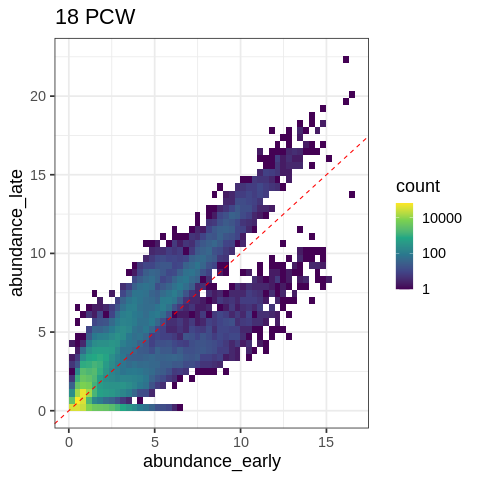

In [88]:
%%R
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d(bins=50) +
geom_abline(linetype=2, color='red') +
scale_fill_viridis_c(trans = "log10") +
theme_bw(base_size=18) +
ggtitle("18 PCW")

In [271]:
age_df = anno_obs[['donor', 'age']].drop_duplicates()
sc_ct_donor_counts = pd.merge(sc_ct_donor_counts, age_df)
df = sc_ct_donor_counts[(sc_ct_donor_counts.organ=='LI') & (sc_ct_donor_counts.anno_lvl_2_final_clean.isin(['HEPATOCYTE_I', 'HEPATOCYTE_II']))]

# df = df[df['Sort_id'].isin(['CD45N', "TOT"])]
df

,organ,anno_lvl_2_final_clean,donor,n_cells,age
177,LI,HEPATOCYTE_I,F19,0,10
178,LI,HEPATOCYTE_II,F19,0,10
652,LI,HEPATOCYTE_I,F21,20,16
653,LI,HEPATOCYTE_II,F21,7,16
1127,LI,HEPATOCYTE_I,F22,155,9
1128,LI,HEPATOCYTE_II,F22,21,9
1602,LI,HEPATOCYTE_I,F23,18,11
1603,LI,HEPATOCYTE_II,F23,1,11
2077,LI,HEPATOCYTE_I,F29,186,17
2078,LI,HEPATOCYTE_II,F29,14,17


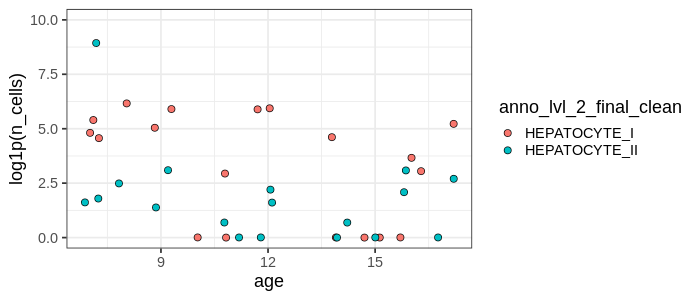

In [274]:
%%R -i df -w 700 -h 300
df %>%
ggplot(aes(age, log1p(n_cells), fill=anno_lvl_2_final_clean)) +
geom_jitter(size=3, width=0.3, shape=21) +
theme_bw(base_size=18) +
ylim(0,10) 


In [191]:
## Get missing cts from early
missing_early = ct_sum[ct_sum['scRNA_reference_ID'] == 'subsetLI.maxAge13'][ct_cols].sum().sort_values()[0:5].index
missing_late = ct_sum[ct_sum['scRNA_reference_ID'] == 'subsetLI.minAge14'][ct_cols].sum().sort_values()[0:20].index


In [201]:
missing_cts = ct_sum[(ct_sum['scRNA_reference_ID'] == 'subsetLI.maxAge13') & (ct_sum['Age_PCW'] == 18)][missing_late]
other_cts = ct_sum[(ct_sum['scRNA_reference_ID'] == 'subsetLI.maxAge13') & (ct_sum['Age_PCW'] == 18)][ct_cols]

### Spleen

In [275]:
org="SP"
abundance_df_all = pd.DataFrame()
adata_ls = {}
min_counts = 500
for f in os.listdir(c2l_results_dir):
    if org in f:
        sdata = sc.read_h5ad(c2l_results_dir + f + '/predmodel/sp.h5ad')
        adata_ls[f] = sdata
        if min_counts is not None:
            sdata[sdata.obs['total_counts'] > min_counts].copy()
        ## Save cell type abundances in separate table
        abundance_df = sdata.obsm['q95_cell_abundance_w_sf'].copy()
        abundance_df.columns = abundance_df.columns.str.strip("q95cell_abundance_w_sf_")
        abundance_df = pd.concat([ sdata.obs[['sample','Age_PCW', "Organ", 'Fetal_id']], abundance_df], 1)
        abundance_df['scRNA_reference_ID'] = f
        abundance_df_all = pd.concat([abundance_df_all, abundance_df])

In [276]:
meta_cols = ['sample','Age_PCW', "Organ", 'Fetal_id', 'scRNA_reference_ID']
ct_cols = abundance_df_all.columns[~abundance_df_all.columns.isin(meta_cols)]
abundance_df_all[ct_cols] = abundance_df_all[ct_cols].fillna(0)
df1 = abundance_df_all[meta_cols].drop_duplicates().reset_index()[meta_cols]
df2 = abundance_df_all.groupby(['sample','scRNA_reference_ID']).sum().reset_index()
df2.drop("Age_PCW", 1, inplace=True)
ct_sum = pd.merge(df1, df2)
ct_sum.index = ct_sum['sample'].astype('str') + "_" +  ct_sum['scRNA_reference_ID'].astype('str')
ct_sum[ct_cols] = ct_sum[ct_cols].fillna(0)

In [426]:
ct_sum[]

,sample,Age_PCW,Organ,Fetal_id,scRNA_reference_ID,ABT(ENTRY),B1,CD4+T,CD8+T,CD8AA,...,CYCLING_ILC,ENTEROENDOCRINE_I,MYELOCYTE,NEUTROPHIL,DC_PROGENITOR,ELP,FIBROBLAST_XI,FIBROBLAST_XVII,GLIAL,MIGRATORY_DC
WSSS_F_IMMsp9838709_subsetSP.minAge14,WSSS_F_IMMsp9838709,11,spleen,F117,subsetSP.minAge14,452.092540,257.028663,392.384695,359.337662,502.182007,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp9838710_subsetSP.minAge14,WSSS_F_IMMsp9838710,18,spleen,F121,subsetSP.minAge14,1761.481923,3191.173912,2869.405484,2625.214591,1391.711099,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp9838714_subsetSP.minAge14,WSSS_F_IMMsp9838714,11,spleen,F117,subsetSP.minAge14,481.483710,281.757848,466.715884,413.740322,433.327882,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp9838715_subsetSP.minAge14,WSSS_F_IMMsp9838715,18,spleen,F121,subsetSP.minAge14,1795.409032,2727.373276,3418.601055,2973.257363,981.492735,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp10864181_subsetSP.minAge14,WSSS_F_IMMsp10864181,18,spleen,F136,subsetSP.minAge14,2847.873701,9432.998172,8526.932554,8050.032706,4128.573900,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp10864182_subsetSP.minAge14,WSSS_F_IMMsp10864182,18,spleen,F136,subsetSP.minAge14,2825.833858,10542.018860,9494.866146,8964.826678,4752.201561,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp11604693_subsetSP.minAge14,WSSS_F_IMMsp11604693,11,spleen,F132,subsetSP.minAge14,2178.959858,635.669726,782.120177,709.945652,393.233372,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp11604694_subsetSP.minAge14,WSSS_F_IMMsp11604694,11,spleen,F132,subsetSP.minAge14,2445.999438,416.026017,509.625996,455.807360,235.306960,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp11604695_subsetSP.minAge14,WSSS_F_IMMsp11604695,15,spleen,F114,subsetSP.minAge14,1959.679625,4163.222546,2316.745341,2121.270375,1210.243668,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WSSS_F_IMMsp11604696_subsetSP.minAge14,WSSS_F_IMMsp11604696,15,spleen,F114,subsetSP.minAge14,1914.178474,4186.499009,2706.153870,2484.704004,1427.792095,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"
Joining, by = "Var1"
Joining, by = "Var2"


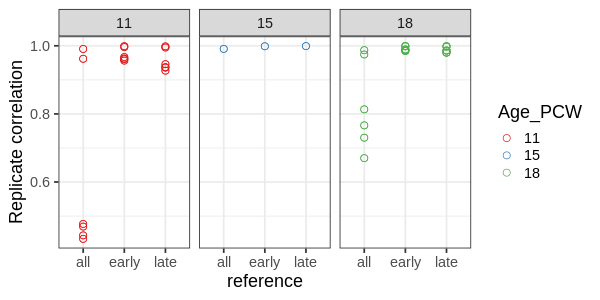

In [487]:
%%R -i ct_sum -i meta_cols -i ct_cols -h 300 -w 600

df <- cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetSP')[ct_cols]))) %>%
    melt() %>%
    left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var1") %>% select(donor_v1=Age_PCW, Var1)) %>%
    left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var2") %>% select(donor_v2=Age_PCW, Var2)) %>%
    filter(value < 1) %>%
    mutate(type=ifelse(donor_v1==donor_v2, 'same_donor', 'different_donor') ) %>%
    mutate(reference='all')
    

df_early <- cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetSP.maxAge13')[ct_cols]))) %>%
    melt() %>%
    left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var1") %>% select(donor_v1=Age_PCW, Var1)) %>%
    left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var2") %>% select(donor_v2=Age_PCW, Var2)) %>%
    filter(value < 1) %>%
    mutate(type=ifelse(donor_v1==donor_v2, 'same_donor', 'different_donor') ) %>%
    mutate(reference='early')

df_late <- cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetSP.minAge14')[ct_cols]))) %>%
    melt() %>%
    left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var1") %>% select(donor_v1=Age_PCW, Var1)) %>%
    left_join(ct_sum[unlist(meta_cols)] %>% rownames_to_column("Var2") %>% select(donor_v2=Age_PCW, Var2)) %>%
    filter(value < 1) %>%
    mutate(type=ifelse(donor_v1==donor_v2, 'same_donor', 'different_donor') ) %>%
    mutate(reference='late')

bind_rows(df_early, df_late, df) %>%
filter(type=="same_donor") %>%
ggplot(aes(reference,  value, color=as.factor(donor_v1))) +
geom_point(size=3, shape=21) +
facet_wrap(.~as.factor(donor_v1)) +
ylab("Replicate correlation") + 
theme_bw(base_size=18) +
scale_color_brewer(palette='Set1', name='Age_PCW')


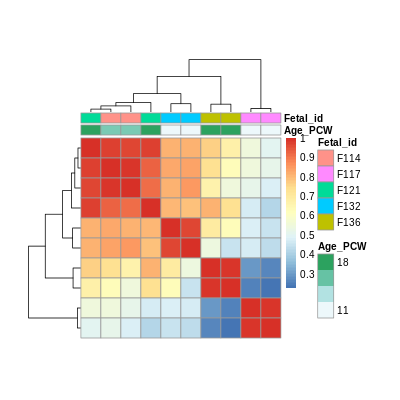

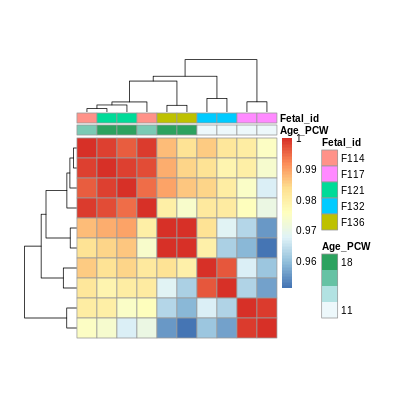

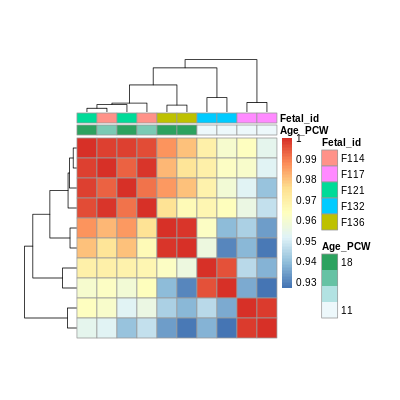

In [284]:
%%R -i ct_sum -i meta_cols -i ct_cols -h 400 -w 400
# Modify ordering of the clusters using clustering callback option
callback = function(hc, mat){
    sv = svd(t(mat))$v[,1]
    dend = reorder(as.dendrogram(hc), wts = sv)
    as.hclust(dend)
    }

pheatmap::pheatmap(cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetSP')[ct_cols]))),  
                   show_rownames=FALSE, show_colnames=FALSE, 
                   cellwidth=20,cellheight=20,
                   annotation_col=ct_sum[,c("Age_PCW", "Fetal_id")], clustering_callback=callback)
pheatmap::pheatmap(cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetSP.maxAge13')[ct_cols]))),  
                   cellwidth=20,cellheight=20,
                   show_rownames=FALSE, show_colnames=FALSE,
                   annotation_col=ct_sum[,c("Age_PCW", "Fetal_id")], clustering_callback=callback)
pheatmap::pheatmap(cor(log1p(t(filter(ct_sum, scRNA_reference_ID=='subsetSP.minAge14')[ct_cols]))),
                   cellwidth=20,cellheight=20,
                   show_rownames=FALSE, show_colnames=FALSE,
                   annotation_col=ct_sum[,c("Age_PCW", "Fetal_id")], clustering_callback=callback)

In [285]:
abundance_early_ref = abundance_df_all[abundance_df_all['scRNA_reference_ID'] == 'subsetSP.maxAge13']
abundance_late_ref = abundance_df_all[abundance_df_all['scRNA_reference_ID'] == 'subsetSP.minAge14']

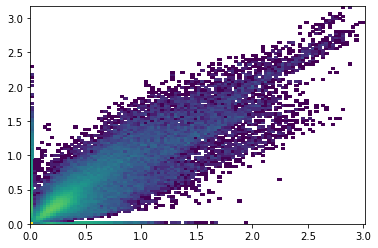

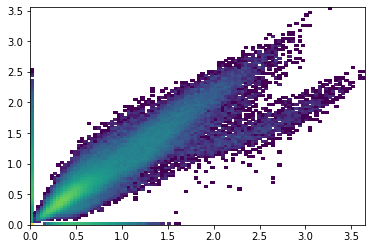

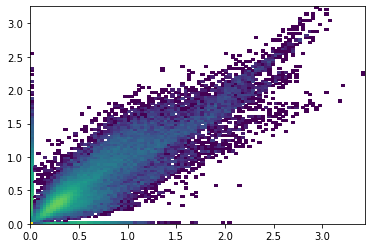

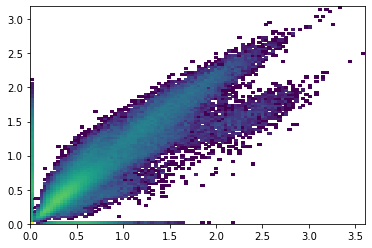

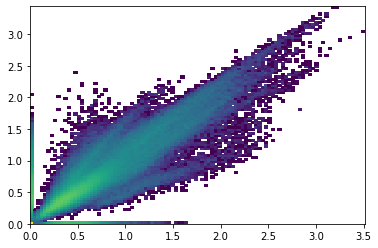

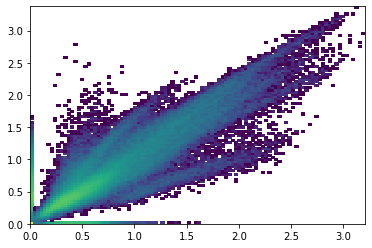

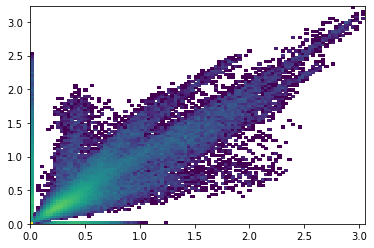

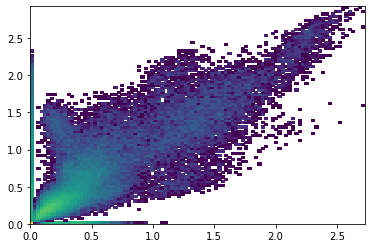

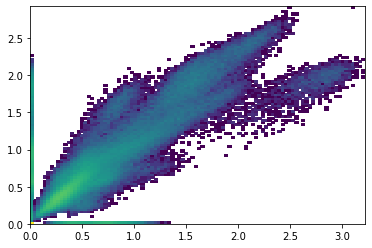

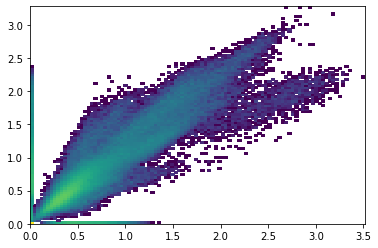

In [286]:
for s in abundance_early_ref['sample'].unique():
    plt.hist2d(np.log1p(abundance_early_ref[abundance_early_ref['sample'] == s][ct_cols].values.flatten()), 
               np.log1p(abundance_late_ref[abundance_late_ref['sample'] == s][ct_cols].values.flatten()), 
               bins=100, norm=matplotlib.colors.LogNorm());
    plt.show()

In [287]:
%%R -i abundance_df_all
nrow(abundance_df_all)

[1] 59247


In [288]:
%%R
early_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetSP.maxAge13' & Age_PCW == 11)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_early=abundance)
late_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetSP.minAge14'& Age_PCW == 11)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_late=abundance)

abundance <- early_abundance %>%
    mutate(abundance_late = late_abundance$abundance_late)

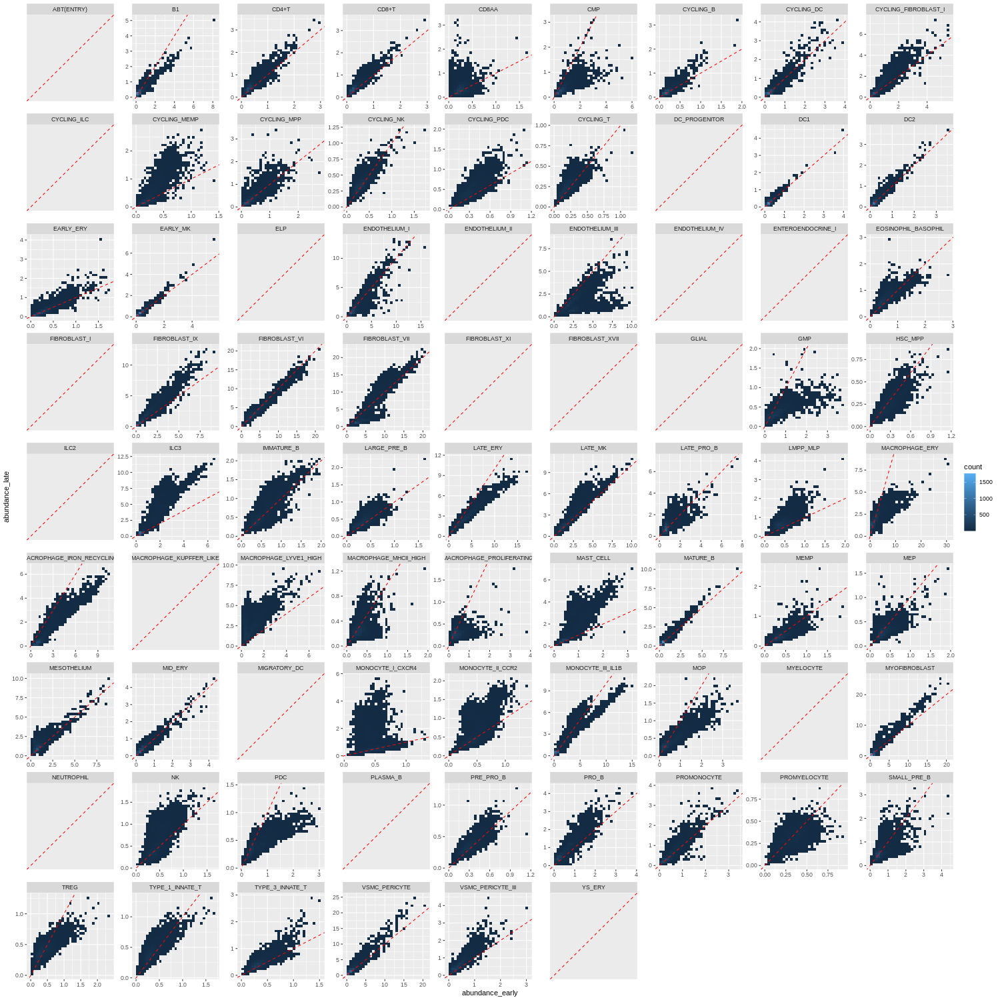

In [289]:
%%R -w 1500 -h 1500
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d() +
facet_wrap(celltype~., scales="free") +
geom_abline(linetype=2, color='red')

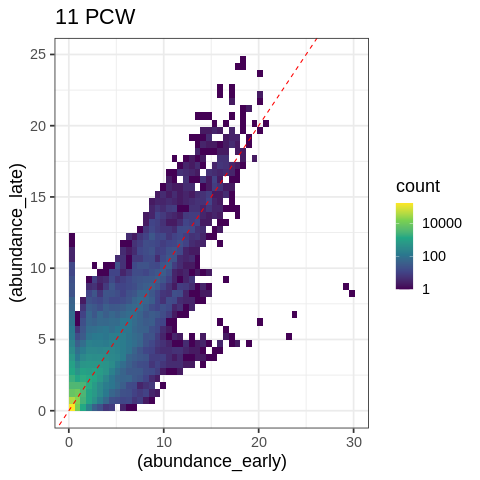

In [292]:
%%R
abundance %>%
ggplot(aes((abundance_early), (abundance_late))) +
geom_bin2d(bins=50) +
geom_abline(linetype=2, color='red') +
scale_fill_viridis_c(trans = "log10") +
theme_bw(base_size=18) +
ggtitle("11 PCW")

In [293]:
%%R
early_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetSP.maxAge13' & Age_PCW == 15)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_early=abundance)
late_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetSP.minAge14' & Age_PCW == 15)[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_late=abundance)

abundance <- early_abundance %>%
    mutate(abundance_late = late_abundance$abundance_late)

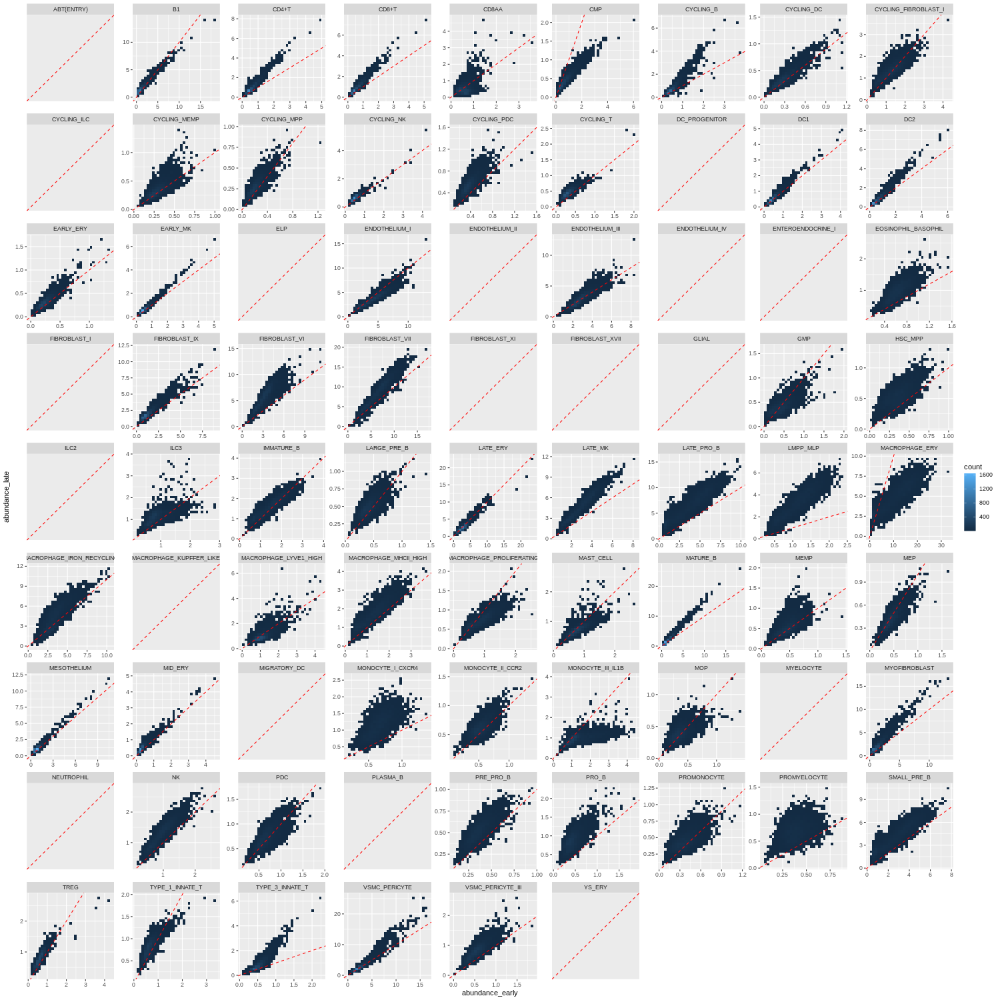

In [294]:
%%R -w 1500 -h 1500
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d() +
facet_wrap(celltype~., scales="free") +
geom_abline(linetype=2, color='red')

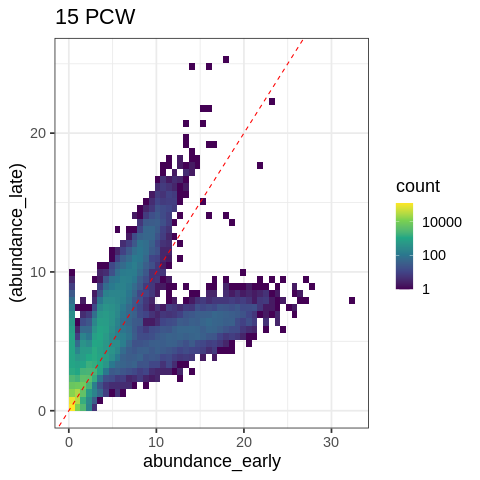

In [295]:
%%R
abundance %>%
ggplot(aes(abundance_early, (abundance_late))) +
geom_bin2d(bins=50) +
geom_abline(linetype=2, color='red') +
scale_fill_viridis_c(trans = "log10") +
theme_bw(base_size=18) +
ggtitle("15 PCW")

In [ ]:
%%R
early_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.maxAge13' & Fetal_id == 'F121')[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_early=abundance)
late_abundance = filter(abundance_df_all, scRNA_reference_ID=='subsetLI.minAge14' & Fetal_id == 'F121')[ct_cols] %>%
    rownames_to_column() %>%
    pivot_longer(ct_cols, names_to='celltype', values_to='abundance') %>%
    rename(abundance_late=abundance)

abundance <- early_abundance %>%
    mutate(abundance_late = late_abundance$abundance_late)

In [ ]:
%%R -w 1500 -h 1500
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d() +
facet_wrap(celltype~., scales="free") +
geom_abline(linetype=2, color='red')

In [ ]:
%%R
abundance %>%
ggplot(aes(abundance_early, abundance_late)) +
geom_bin2d(bins=50) +
geom_abline(linetype=2, color='red') +
scale_fill_viridis_c(trans = "log10") +
theme_bw(base_size=18) +
ggtitle("18 PCW")

In [340]:
ab_all = abundance_df_all[abundance_df_all['scRNA_reference_ID'].str.endswith(org)][ct_cols]
ab_early = abundance_df_all[abundance_df_all['scRNA_reference_ID'].str.endswith('maxAge13')][ct_cols]
ab_late = abundance_df_all[abundance_df_all['scRNA_reference_ID'].str.endswith('minAge14')][ct_cols]

In [394]:
import sklearn
# dist_spots = sklearn.metrics.pairwise.euclidean_distances(ab_all, ab_early)
dist_cts_allVSearly = sklearn.metrics.pairwise.euclidean_distances(ab_all.T, ab_early.T)
dist_cts_lateVSall = sklearn.metrics.pairwise.euclidean_distances(ab_all.T, ab_late.T)

In [395]:
dist_df = pd.DataFrame([np.diag(dist_cts_allVSearly), np.diag(dist_cts_lateVSall)]).T
dist_df.index = ab_all.columns
dist_df.columns = ['dist_early2all', 'dist_late2all']
dist_df

,dist_early2all,dist_late2all
ABT(ENTRY),131.214679,47.855479
B1,133.663496,43.603849
CD4+T,94.726325,33.365885
CD8+T,65.841382,30.951776
CD8AA,85.830987,30.270807
...,...,...
ELP,72.293803,72.293803
FIBROBLAST_XI,138.712776,138.712776
FIBROBLAST_XVII,248.247463,248.247463
GLIAL,288.842069,288.842069


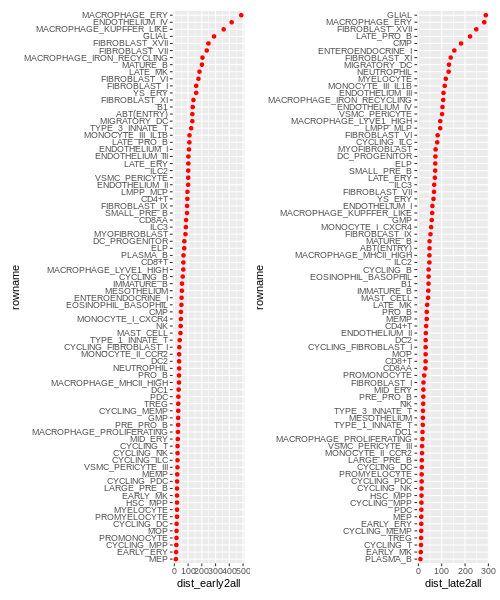

In [400]:
%%R -i dist_df -h 600 -w 500
dist_df %>%
rownames_to_column() %>%
arrange(dist_early2all) %>%
mutate(rowname=factor(rowname, levels=rowname)) %>%
 ggplot(aes(rowname, dist_early2all)) +
    geom_point(color='red') +
    coord_flip() +
dist_df %>%
rownames_to_column() %>%
arrange(dist_late2all) %>%
mutate(rowname=factor(rowname, levels=rowname)) %>%
 ggplot(aes(rowname, dist_late2all)) +
    geom_point(color='red') +
    coord_flip()

In [418]:
adata = adata_ls['subsetSP.minAge14'].copy()
abundance_df = adata.obsm['q95_cell_abundance_w_sf'].copy()
abundance_df.columns = abundance_df.columns.str.strip("q95cell_abundance_w_sf_")
if any(adata.obs.columns.isin(abundance_df.columns)):
    adata.obs.drop(abundance_df.columns, 1, inplace=True)
adata.obs = pd.concat([adata.obs, abundance_df], 1)

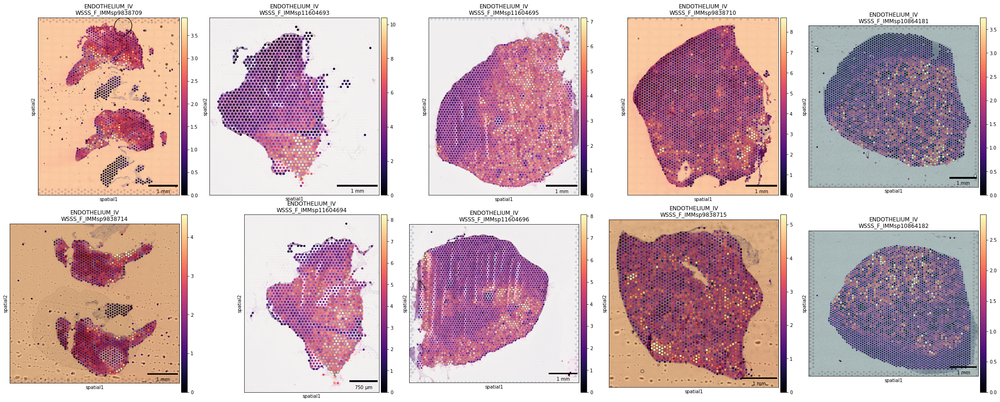

In [419]:
ordered_samples = adata.obs.sort_values(["Age_PCW", "Fetal_id"])['sample'].unique().tolist()

fig = plot_spatial_per_cell_type(adata, cell_type='ENDOTHELIUM_IV', 
                                 samples = ordered_samples, 
                                 ncol=5, figsize=(30,12))

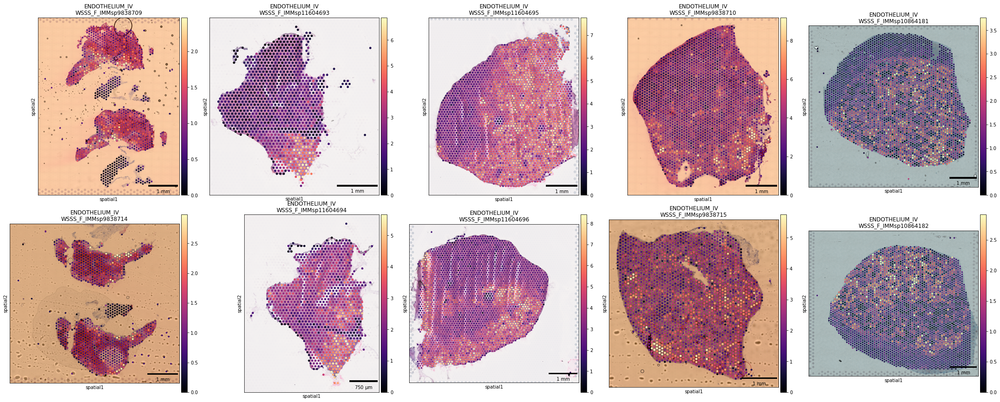

In [421]:
adata = adata_ls['subsetSP'].copy()
abundance_df = adata.obsm['q95_cell_abundance_w_sf'].copy()
abundance_df.columns = abundance_df.columns.str.strip("q95cell_abundance_w_sf_")
if any(adata.obs.columns.isin(abundance_df.columns)):
    adata.obs.drop(abundance_df.columns, 1, inplace=True)
adata.obs = pd.concat([adata.obs, abundance_df], 1)
ordered_samples = adata.obs.sort_values(["Age_PCW", "Fetal_id"])['sample'].unique().tolist()

fig = plot_spatial_per_cell_type(adata, cell_type='ENDOTHELIUM_IV', 
                                 samples = ordered_samples, 
                                 ncol=5, figsize=(30,12))

In [424]:
adata.obs['in_tissue']

1.0

In [191]:
## Get missing cts from early
missing_early = ct_sum[ct_sum['scRNA_reference_ID'] == 'subsetLI.maxAge13'][ct_cols].sum().sort_values()[0:5].index
missing_late = ct_sum[ct_sum['scRNA_reference_ID'] == 'subsetLI.minAge14'][ct_cols].sum().sort_values()[0:20].index


In [201]:
missing_cts = ct_sum[(ct_sum['scRNA_reference_ID'] == 'subsetLI.maxAge13') & (ct_sum['Age_PCW'] == 18)][missing_late]
other_cts = ct_sum[(ct_sum['scRNA_reference_ID'] == 'subsetLI.maxAge13') & (ct_sum['Age_PCW'] == 18)][ct_cols]

In [626]:
def run_colocation_nmf(adata_early, adata_late):
    from cell2location.models.downstream import CoLocatedGroupsSklearnNMF

    ## Merge in one object for NMF analysis
    X_location_early = adata_early.obsm['q95_cell_abundance_w_sf'].copy()
    X_location_late = adata_late.obsm['q95_cell_abundance_w_sf'].copy()
    X_location_all = pd.concat([X_location_early, X_location_late]).fillna(0) ## Set missing cts to 0

    nmf_model = CoLocatedGroupsSklearnNMF(n_fact=10, X_data=X_location_all, n_iter=20000)

    nmf_model.fit()

    nmf_model.sample2df(node_name="nUMI_factors", ct_node_name="cell_type_factors")

    X_cts = nmf_model.cell_type_fractions.copy()
    X_cts.index = X_location_all.columns.str.strip("q95cell_abundance_w_sf_")
    X_cts.columns = [x[1] for x in X_cts.columns.str.split("mean_cell_type_factors")]

    X_locations = nmf_model.location_factors_df.copy()
    X_locations.index = X_location_all.index
    X_locations.columns = [x[1] for x in X_locations.columns.str.split("mean_nUMI_factors")]

    adata_early.obsm['nmf'] = X_locations.loc[adata_early.obs_names]
    adata_late.obsm['nmf'] = X_locations.loc[adata_late.obs_names]
    return(adata_early, adata_late, X_cts)

In [576]:
def plot_nmf_fractions_ct(pl_df, org_fs, outfile, hm_height=10, hm_width=12):
    r_fct_str = '''
    library(tidyverse)
    plot_nmf_fractions <- function(pl_df, org_fs, outfile, save=TRUE, pl_height=10, pl_width=12){
        p1 <- pl_df %>%
            rownames_to_column("cell_type") %>%
            pivot_longer(cols=- cell_type, names_to="factor", values_to="ct_fraction") %>%
            mutate(factor=str_remove(factor, "mean_cell_type_factors")) %>%
            group_by(cell_type) %>%
            mutate(top_fact = which.max(ct_fraction)) %>%
            ungroup() %>%
            arrange(top_fact) %>%
            mutate(cell_type=factor(cell_type, levels=unique(cell_type))) %>%
            filter(factor %in% org_fs) %>%
            mutate(factor = factor(str_replace(factor, "fact_", "Factor "), levels=str_replace(org_fs, "fact_", "Factor "))) %>%
            ggplot(aes(factor, cell_type, color=ct_fraction, size=ct_fraction)) +
            geom_point() +
            scale_color_viridis_c(option='magma', direction=-1, name="cell type\nfraction", guide = "legend") +
            scale_size(name="cell type\nfraction") +
            ylab("cell type") +
            theme_bw(base_size=14) +
            theme(axis.text.x=element_text(angle=45, hjust=1, vjust=1)
                 )
        if (isTRUE(save)){
            print(paste0('saving to ', outfile))
            ggsave(paste0(outfile, '.pdf'), p1, height=pl_height, width=pl_width)
            ggsave(paste0(outfile, '.png'), p1, height=pl_height, width=pl_width)
          } else {
           print("not saving")
          p1   
        }
    }
    '''

    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP

    r_pkg = STAP(r_fct_str, "r_pkg")
    # PASS OBJECTS INTO FUNCTION
    r_pkg.plot_nmf_fractions(pl_df, org_fs, outfile, pl_height = hm_height, pl_width = hm_width)

def plot_nmf_spatial(adata_vis, org_fs, lib, outfile, ncols=2):
    ## Save spatial plots 
    sns.set_context("talk")
    plt.rcParams["figure.figsize"] = [10,10]
    plt.rcParams['axes.titlesize'] = 32
    plt_titles = [None] + ["Factor " + x.split("_")[1] for x in org_fs.values]
    _spatial_plot_lib(adata_vis, color=[None] + list(org_fs.values), lib=lib, ncols=ncols, size=1.3, 
                      save=outfile, frameon=False,
                      title=plt_titles, show=False
                     )
    plt.rcParams['axes.titlesize'] = 20


def get_nmf_frac_4_plotting(nmf_fractions, org, org_fs, min_prop=0.25):
    ## Filter cell types by minimum proportion assigned to fraction
    filt_nmf_fractions = nmf_fractions[nmf_fractions[[ x for x in org_fs]].max(1) > min_prop]
    pl_df = filt_nmf_fractions[[ x for x in org_fs]]

    ## Exclude low Q annotations
    pl_df = pl_df[~pl_df.index.isin(anno_groups_dict["OTHER"])]

    return(pl_df)

In [579]:
import json
with open('../../metadata/anno_groups.json', 'r') as json_file:
    anno_groups_dict = json.load(json_file)

anno_groups_dict_rev = {x:g for g,a in anno_groups_dict.items() for x in a}
anno_groups_dict_rev = {"_".join(k.split("/")):v for k,v in anno_groups_dict_rev.items()}

In [579]:
org_fs = X_cts.columns
pl_df = get_nmf_frac_4_plotting(X_cts, org, org_fs, min_prop=0)
plot_nmf_fractions_ct(pl_df, org_fs, 
                      outfile=figdir + 'top_factors_' + org, 
                      hm_height=15,
                      hm_width=8
                     )

[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA_v2/top_factors_SP"
